# Proyek Analisis Data: Olist Brazilian E-Commerce
- Nama: Iqbal Ahdagita Elbadra
- Email: spfindo@gmail.com  
- Id Dicoding: iqbal_ahdagita

## Business Understanding

Olist, sebuah e-commerce di Brasil, menyediakan platform online yang bertujuan mempermudah penjualan langsung di berbagai situs e-commerce Brasil. Platform ini menghubungkan para pengusaha dengan pengecer besar secara online, memungkinkan pemilik toko untuk beriklan dan menjual produk tanpa kerumitan. Dengan Olist, perusahaan ritel dapat menjangkau pasar internasional, meningkatkan pengalaman berbelanja, dan mengubah pola pembelian pelanggan. Olist menghubungkan usaha kecil dari seluruh Brasil ke dalam saluran distribusi dengan satu kontrak yang sederhana. Melalui Olist Store, pedagang dapat menjual produk mereka dan mengandalkan mitra logistik Olist untuk mengirimkan barang langsung kepada pelanggan.

Setelah pelanggan melakukan pembelian di Olist Store, penjual diberi pemberitahuan untuk memproses pesanan tersebut. Ketika produk telah diterima oleh pelanggan atau tanggal pengiriman perkiraan telah tiba, pelanggan diminta untuk mengisi survei kepuasan melalui email. Survei ini memungkinkan pelanggan memberikan penilaian terhadap pengalaman pembelian dan memberikan komentar terkait proses tersebut.


# Context


Dataset ini mencakup informasi tentang 100 ribu pesanan dari tahun 2016 hingga 2018 yang dilakukan di berbagai pasar di Brasil. Fitur-fiturnya memungkinkan untuk melihat pesanan dari berbagai perspektif, mulai dari status pesanan, harga, pembayaran, kinerja pengiriman, lokasi pelanggan, atribut produk, hingga ulasan yang ditulis oleh pelanggan. Sementara itu, dataset geolokasi menyediakan informasi tentang koordinat lintang/bujur yang berkaitan dengan kode pos di Brasil.

# Problem Statement

Selama satu tahun terakhir, Olist telah mengumpulkan sejumlah besar data yang beragam, mencakup informasi yang terpisah, seperti data yang diagregasi, data unik, atau bahkan kombinasi dari keduanya (diagregasi pada data unik). Namun, dengan dataset Olist saat ini, tantangannya terletak pada kesulitan mengidentifikasi perilaku pelanggan karena kurangnya representasi segmen pelanggan. Bahkan setelah pemahaman melalui segmentasi, belum jelas jenis pendekatan apa yang sebaiknya diambil.

Beberapa pertanyaan yang perlu dijawab dalam proyek ini:

-Apakah ada tren pertumbuhan penjualan e-commerce di Brasil? <br>
-Bagaimana distribusi total penjualan di berbagai negara bagian di Brasil? <br>
-Negara bagian mana yang paling baik untuk bertransaksi di Brasil? <br>
-Bagaimana jenis pembayaran dapat mempengaruhi kegiatan e-commerce? <br>
-Bagaimana perilaku pelanggan? <br>
-Bagaimana cara terbaik untuk mengklasifikasikan mereka? <br>


## Library

In [8]:
# Import
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
pd.options.display.max_columns = None
import scipy.stats as stats
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import json
import requests
import folium
from statsmodels.stats.outliers_influence import variance_inflation_factor
from math import floor
from matplotlib import ticker
import missingno
from scipy.stats import kruskal
from matplotlib.gridspec import GridSpec
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

# Utility
from viz_utils import *
from custom_transformers import *

# Data Prep
from scipy.stats import probplot
import squarify
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import KBinsDiscretizer, RobustScaler

# Pemodelan
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from geopy.distance import distance
from sklearn.model_selection import train_test_split


# Data Wrangling

In [9]:
# Membaca Data
orders = pd.read_csv('data\olist_orders_dataset.csv')
order_reviews = pd.read_csv('data\olist_order_reviews_dataset.csv')
customer = pd.read_csv('data\olist_customers_dataset.csv')
order_payments = pd.read_csv('data\olist_order_payments_dataset.csv')
order_items = pd.read_csv('data\olist_order_items_dataset.csv')
products = pd.read_csv('data\olist_products_dataset.csv')
products_english = pd.read_csv('data\product_category_name_translation.csv')
sellers = pd.read_csv('data\olist_sellers_dataset.csv')
geo = pd.read_csv('data\olist_geolocation_dataset.csv')

In [12]:
# Overview dari Data
dataset_dictionary = {
    'Orders':orders, 'Order Reviews':order_reviews, 'Customer':customer,
    'Order Payments':order_payments, 'Order Items':order_items, 'Products':products,
    'Products dalam Bahasa Inggris':products_english, 'Sellers':sellers, 'Geolocation':geo
}

datasets_summary = pd.DataFrame()
datasets_summary['Dataset'] = [data[0] for data in dataset_dictionary.items()]
datasets_summary['Kolom'] = [', '.join([col[0] for col in data[1].isnull().sum().items()])
                               for data in dataset_dictionary.items()]
datasets_summary['Baris'] = [data[1].shape[0] for data in dataset_dictionary.items()]
datasets_summary['Kolom'] = [data[1].shape[1] for data in dataset_dictionary.items()]
datasets_summary['Duplikat'] = [data[1].duplicated().sum() for data in dataset_dictionary.items()]
datasets_summary['Nulls'] = [data[1].isnull().sum().sum() for data in dataset_dictionary.items()]
datasets_summary['Kolom dengan Nulls'] = [', '.join([col for col, null in data[1].isnull().sum().items() if null > 0])
                                         for data in dataset_dictionary.items()]
datasets_summary.set_index('Dataset').style.background_gradient(cmap='YlGnBu')


,Kolom,Baris,Duplikat,Nulls,Kolom dengan Nulls
Dataset,,,,,
Orders,8,99441,0,4908,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
Order Reviews,7,99224,0,145903,"review_comment_title, review_comment_message"
Customer,5,99441,0,0,
Order Payments,5,103886,0,0,
Order Items,7,112650,0,0,
Products,9,32951,0,2448,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
Products dalam Bahasa Inggris,2,71,0,0,
Sellers,4,3095,0,0,
Geolocation,5,1000163,261831,0,


In [14]:
# Menampilkan Dataframe Order dan Order Reviews Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([orders, order_reviews], ['Orders', 'Order Reviews']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    duplicates = data['order_id'].duplicated().sum()
    print(f'Total duplikat dari kunci utama pada DataFrame {name} adalah {duplicates}.')



------------------------------------------------------------------- Orders DataFrame ------------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


Total duplikat dari kunci utama pada DataFrame Orders adalah 0.

--------------------------------------------------------------- Order Reviews DataFrame ---------------------------------------------------------------


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


Total duplikat dari kunci utama pada DataFrame Order Reviews adalah 551.


In [15]:
# Menggabungkan Dataframe Order dan Order Reviews Berdasarkan order_id
merged_1 = orders.merge(
    order_reviews[order_reviews['order_id'].duplicated() == False][['order_id', 'review_score']],
    how='left',
    on='order_id'
)
display(merged_1.head())
merged_1.info(verbose=False)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Columns: 9 entries, order_id to review_score
dtypes: float64(1), object(8)
memory usage: 7.6+ MB


In [17]:
# Menampilkan Dataframe Merged 1 dan Customers Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([merged_1, customer], ['Merged 1', 'Customers']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    duplicates = data['customer_id'].duplicated().sum()
    print(f'Total duplikat dari kunci utama pada DataFrame {name} adalah {duplicates}.')


------------------------------------------------------------------ Merged 1 DataFrame -----------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0


Total duplikat dari kunci utama pada DataFrame Merged 1 adalah 0.

----------------------------------------------------------------- Customers DataFrame -----------------------------------------------------------------


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


Total duplikat dari kunci utama pada DataFrame Customers adalah 0.


In [18]:
# Menggabungkan Dataframe Merged 1 dan Dataframe Customers Berdasarkan customer_id
stored_temporary = merged_1['customer_id']
merged_1.drop('customer_id', axis=1, inplace=True)
merged_1['customer_id'] = stored_temporary

customer_orders = merged_1.merge(
    customer,
    how='left',
    on='customer_id'
)
display(customer_orders.head())
customer_orders.info(verbose=False)


,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,f88197465ea7920adcdbec7375364d82,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,8ab97904e6daea8866dbdbc4fb7aad2c,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


<class 'pandas.core.frame.DataFrame'>
Int64Index: 99441 entries, 0 to 99440
Columns: 13 entries, order_id to customer_state
dtypes: float64(1), int64(1), object(11)
memory usage: 10.6+ MB


In [19]:
# Menampilkan Dataframe Customer Orders dan Order Payments Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([customer_orders, order_payments], ['Customer Orders', 'Order Payments']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    duplicates = data['order_id'].duplicated().sum()
    print(f'Total duplikat dari kunci utama pada DataFrame {name} adalah {duplicates}.')



-------------------------------------------------------------- Customer Orders DataFrame --------------------------------------------------------------


,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,f88197465ea7920adcdbec7375364d82,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,8ab97904e6daea8866dbdbc4fb7aad2c,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


Total duplikat dari kunci utama pada DataFrame Customer Orders adalah 0.

--------------------------------------------------------------- Order Payments DataFrame --------------------------------------------------------------


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


Total duplikat dari kunci utama pada DataFrame Order Payments adalah 4446.


In [20]:
# Menggabungkan Dataframe Customer Orders dan Order Payments Berdasarkan order_id
customer_payments = customer_orders[[
    'order_id', 'customer_unique_id', 'order_purchase_timestamp'
]].merge(
    order_payments,
    how='left',
    on='order_id'
)
display(customer_payments.head())
customer_payments.info(verbose=False)


,order_id,customer_unique_id,order_purchase_timestamp,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,1.0,credit_card,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,3.0,voucher,1.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0,voucher,1.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,1.0,boleto,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,1.0,credit_card,3.0,179.12


<class 'pandas.core.frame.DataFrame'>
Int64Index: 103887 entries, 0 to 103886
Columns: 7 entries, order_id to payment_value
dtypes: float64(3), object(4)
memory usage: 6.3+ MB


In [21]:
# Memasukkan Terjemahan Nama Kategori Produk dari Bahasa Portugis ke Bahasa Inggris
products_english = products_english.append({
    'product_category_name': 'portateis_cozinha_e_preparadores_de_alimentos',
    'product_category_name_english': 'mobile cooker'
}, ignore_index=True).append({
    'product_category_name': 'pc_gamer',
    'product_category_name_english': 'pc games'
}, ignore_index=True)

def splitter(cols):
    return ' '.join(cols[0].split('_'))

products_english['product_category_name_english'] = products_english[['product_category_name_english']].apply(splitter, axis=1)

def category_mapping(cols):
    try:
        translate = products_english.loc[products_english['product_category_name'] == cols, 'product_category_name_english'].values[0]
    except:
        translate = cols
    return translate

products['product_category_name'] = products['product_category_name'].apply(category_mapping)


In [22]:
# Menampilkan Dataframe Order Items dan Product Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([order_items, products], ['Order Items', 'Products']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    duplicates = data['product_id'].duplicated().sum()
    print(f'Total duplikat dari kunci utama pada DataFrame {name} adalah {duplicates}.')



---------------------------------------------------------------- Order Items DataFrame ----------------------------------------------------------------


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


Total duplikat dari kunci utama pada DataFrame Order Items adalah 79699.

------------------------------------------------------------------ Products DataFrame -----------------------------------------------------------------


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,art,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,sports leisure,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,baby,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,housewares,37.0,402.0,4.0,625.0,20.0,17.0,13.0


Total duplikat dari kunci utama pada DataFrame Products adalah 0.


In [23]:
# Menggabungkan Dataframe Order Items dan Produk Berdasarkan product_id
merged_2 = order_items.drop(
    'shipping_limit_date',
    axis=1
).merge(
    products.drop(['product_name_lenght', 'product_description_lenght', 'product_photos_qty'], axis=1),
    how='left',
    on='product_id'
)
display(merged_2.head())
merged_2.info(verbose=False)


,order_id,order_item_id,product_id,seller_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,perfumery,200.0,16.0,10.0,15.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Columns: 11 entries, order_id to product_width_cm
dtypes: float64(6), int64(1), object(4)
memory usage: 10.3+ MB


In [24]:
# Menampilkan Dataframe Merged 2 dan Sellers Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([merged_2, sellers], ['Merged 2', 'Sellers']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    duplicates = data['seller_id'].duplicated().sum()
    print(f'Total duplikat dari kunci utama pada DataFrame {name} adalah {duplicates}.')



------------------------------------------------------------------ Merged 2 DataFrame -----------------------------------------------------------------


,order_id,order_item_id,product_id,seller_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,12.99,12.79,perfumery,200.0,16.0,10.0,15.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0


Total duplikat dari kunci utama pada DataFrame Merged 2 adalah 109555.

------------------------------------------------------------------ Sellers DataFrame ------------------------------------------------------------------


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


Total duplikat dari kunci utama pada DataFrame Sellers adalah 0.


In [25]:
# Menggabungkan Dataframe Merged 2 dan Dataframe Penjual Berdasarkan seller_id
stored_temporary = merged_2['seller_id']
merged_2.drop('seller_id', axis=1, inplace=True)
merged_2['seller_id'] = stored_temporary

sales_history = merged_2.merge(
    sellers,
    how='left',
    on='seller_id'
)
display(sales_history.head())
sales_history.info(verbose=False)


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Columns: 14 entries, order_id to seller_state
dtypes: float64(6), int64(2), object(6)
memory usage: 12.9+ MB


In [26]:
# Menampilkan Dataframe Customer Orders dan Sales History Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([customer_orders, sales_history], ['Customer Orders', 'Sales History']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    duplicates = data['order_id'].duplicated().sum()
    print(f'Total duplikat dari kunci utama pada DataFrame {name} adalah {duplicates}.')



-------------------------------------------------------------- Customer Orders DataFrame --------------------------------------------------------------


,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,4.0,9ef432eb6251297304e76186b10a928d,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,4.0,b0830fb4747a6c6d20dea0b8c802d7ef,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,5.0,41ce2a54c0b03bf3443c3d931a367089,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,5.0,f88197465ea7920adcdbec7375364d82,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,5.0,8ab97904e6daea8866dbdbc4fb7aad2c,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


Total duplikat dari kunci utama pada DataFrame Customer Orders adalah 0.

--------------------------------------------------------------- Sales History DataFrame ---------------------------------------------------------------


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR


Total duplikat dari kunci utama pada DataFrame Sales History adalah 13984.


In [27]:
# Menggabungkan Dataframe Customer Orders dan Dataframe Sales History Berdasarkan order_id
order_history = sales_history.merge(
    customer_orders,
    how='left',
    on='order_id'
)
display(order_history.head())
order_history.info(verbose=False)


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP


<class 'pandas.core.frame.DataFrame'>
Int64Index: 112650 entries, 0 to 112649
Columns: 26 entries, order_id to customer_state
dtypes: float64(7), int64(3), object(16)
memory usage: 23.2+ MB


In [28]:
# Menampilkan Dataframe Order History dan Customer Payments Beserta Jumlah Duplikat dari Kunci Utama
for data, name in zip([order_history, customer_payments], ['Order History', 'Customer Payments']):
    print('\n' + (' ' + name + ' DataFrame ').center(151, '-'))
    display(data.head())
    print('Ukuran Data:', data.shape, '(Baris & Kolom)')



--------------------------------------------------------------- Order History DataFrame ---------------------------------------------------------------


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,58.90,13.29,cool stuff,650.0,28.0,9.0,14.0,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,SP,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,5.0,3ce436f183e68e07877b285a838db11a,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,239.90,19.93,pet shop,30000.0,50.0,30.0,40.0,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,SP,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,4.0,f6dd3ec061db4e3987629fe6b26e5cce,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,199.00,17.87,furniture decor,3050.0,33.0,13.0,33.0,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,MG,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,5.0,6489ae5e4333f3693df5ad4372dab6d3,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,12.99,12.79,perfumery,200.0,16.0,10.0,15.0,9d7a1d34a5052409006425275ba1c2b4,14403,franca,SP,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,4.0,d4eb9395c8c0431ee92fce09860c5a06,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,199.90,18.14,garden tools,3750.0,35.0,40.0,30.0,df560393f3a51e74553ab94004ba5c87,87900,loanda,PR,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,5.0,58dbd0b2d70206bf40e62cd34e84d795,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP


Ukuran Data: (112650, 26) (Baris & Kolom)

------------------------------------------------------------- Customer Payments DataFrame -------------------------------------------------------------


,order_id,customer_unique_id,order_purchase_timestamp,payment_sequential,payment_type,payment_installments,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,1.0,credit_card,1.0,18.12
1,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,3.0,voucher,1.0,2.00
2,e481f51cbdc54678b7cc49136f2d6af7,7c396fd4830fd04220f754e42b4e5bff,2017-10-02 10:56:33,2.0,voucher,1.0,18.59
3,53cdb2fc8bc7dce0b6741e2150273451,af07308b275d755c9edb36a90c618231,2018-07-24 20:41:37,1.0,boleto,1.0,141.46
4,47770eb9100c2d0c44946d9cf07ec65d,3a653a41f6f9fc3d2a113cf8398680e8,2018-08-08 08:38:49,1.0,credit_card,3.0,179.12


Ukuran Data: (103887, 7) (Baris & Kolom)


In [80]:
# Pemetaan Kode Negara Bagian dengan Nama Negara Bagian
state_dictionary = {
    'AC': 'Acre', 'AL': 'Alagoas', 'AM': 'Amazonas', 'AP': 'Amapá',
    'BA': 'Bahia',
    'CE': 'Ceará',
    'DF': 'Distrito Federal',
    'ES': 'Espírito Santo',
    'GO': 'Goiás',
    'MA': 'Maranhão', 'MG': 'Minas Gerais', 'MS': 'Mato Grosso do Sul', 'MT': 'Mato Grosso',
    'PA': 'Pará', 'PB': 'Paraíba', 'PE': 'Pernambuco', 'PI': 'Piauí', 'PR': 'Paraná',
    'RJ': 'Rio de Janeiro', 'RN': 'Rio Grande do Norte', 'RO': 'Rondônia', 'RR': 'Roraima', 'RS': 'Rio Grande do Sul',
    'SC': 'Santa Catarina', 'SE': 'Sergipe', 'SP': 'São Paulo',
    'TO': 'Tocantins'
}

def states_name(cols):
    return state_dictionary[cols]

for column in ['customer_state', 'seller_state']:
    order_history[column] = order_history[column].apply(states_name)


KeyError: 'Rio de Janeiro'

Deskripsi :

- `order_id`: identifikasi unik pesanan.
- `order_item_id`: nomor urut yang mengidentifikasi jumlah item dalam pesanan yang sama.
- `product_id`: identifikasi unik produk.
- `seller_id`: identifikasi unik penjual.
- `shipping_limit_date`: Menunjukkan batas waktu pengiriman penjual untuk menyerahkan pesanan ke mitra logistik.
- `price`: harga item.
- `freight_value`: nilai ongkos kirim item (jika pesanan memiliki lebih dari satu item, nilai ongkos kirim dibagi antara item).
- `customer_id`: kunci untuk dataset pesanan. Setiap pesanan memiliki customer_id unik.
- `order_status`: Referensi untuk status pesanan (telah dikirim, sedang dikirim, dll.).
- `order_purchase_timestamp`: Menunjukkan timestamp pembelian.
- `order_approved_at`: Menunjukkan timestamp persetujuan pembayaran.
- `order_delivered_carrier_date`: Menunjukkan timestamp posting pesanan. Ketika pesanan diserahkan ke mitra logistik.
- `order_delivered_customer_date`: Menunjukkan tanggal pengiriman pesanan yang sebenarnya kepada pelanggan.
- `order_estimated_delivery_date`: Menunjukkan tanggal perkiraan pengiriman yang diinformasikan kepada pelanggan saat pembelian.
- `payment_sequential`: seorang pelanggan dapat membayar pesanan dengan lebih dari satu metode pembayaran. Jika demikian, urutan akan dibuat untuk menampung semua pembayaran.
- `payment_type`: metode pembayaran yang dipilih oleh pelanggan.
- `payment_installments`: jumlah angsuran yang dipilih oleh pelanggan.
- `payment_value`: nilai transaksi.
- `review_id`: identifikasi unik ulasan.
- `review_score`: Nilai berkisar dari 1 hingga 5 yang diberikan oleh pelanggan dalam survei kepuasan.
- `review_comment_title`: Judul komentar dari ulasan yang ditinggalkan oleh pelanggan, dalam bahasa Portugis.
- `review_comment_message`: Pesan komentar dari ulasan yang ditinggalkan oleh pelanggan, dalam bahasa Portugis.
- `review_creation_date`: Menunjukkan tanggal ketika survei kepuasan dikirimkan kepada pelanggan.
- `review_answer_timestamp`: Menunjukkan timestamp jawaban survei kepuasan.
- `product_category_name`: kategori akar produk, dalam bahasa Portugis.
- `product_name_lenght`: jumlah karakter yang diekstrak dari nama produk.
- `product_description_lenght`: jumlah karakter yang diekstrak dari deskripsi produk.
- `product_photos_qty`: jumlah foto produk yang diterbitkan.
- `product_weight_g`: berat produk diukur dalam gram.
- `product_length_cm`: panjang produk diukur dalam sentimeter.
- `product_height_cm`: tinggi produk diukur dalam sentimeter.
- `product_width_cm`: lebar produk diukur dalam sentimeter.
- `customer_unique_id`: identifikasi unik pelanggan.
- `customer_zip_code_prefix`: lima digit pertama kode pos pelanggan.
- `customer_city`: nama kota pelanggan.
- `customer_state`: singkatan negara bagian pelanggan.
- `geolocation_lat_x`: lintang pelanggan.
- `geolocation_lng_x`: bujur pelanggan.
- `seller_zip_code_prefix`: lima digit pertama kode pos penjual.
- `seller_city`: nama kota penjual.
- `seller_state`: singkatan negara bagian penjual.
- `geolocation_lat_y`: lintang penjual.
- `geolocation_lng_y`: bujur penjual.
- `product_category_name_english`: nama kategori dalam bahasa Inggris.

## Exploratory Data Analysis

In [31]:
# Menampilkan Informasi Atribut dari Dataframe Order History dan Customer Payments
for idx, data in enumerate([order_history, customer_payments]):
    title = 'Order History' if idx == 0 else 'Customer Payments'
    print('\n' + (f' Informasi Atribut dari Data {title} ').center(151, '='))
    attributes_info = [
        [
            col,
            data[col].dtype,
            data[col].nunique(),
            list(data[col].unique())[:5],
            data[col].isnull().sum()
        ] for col in data
    ]

    pd.set_option('display.max_colwidth', 100)
    display(pd.DataFrame(
        data=attributes_info,
        columns=[
            'Atribut',
            'Tipe Data',
            'Total Unik',
            'Unik Sample',
            'Total Missing'
        ]
    ))



====================================================== Informasi Atribut dari Data Order History ======================================================


,Atribut,Tipe Data,Total Unik,Unik Sample,Total Missing
0,order_id,object,98666,"[00010242fe8c5a6d1ba2dd792cb16214, 00018f77f2f0320c557190d7a144bdd3, 000229ec398224ef6ca0657da4f...",0
1,order_item_id,int64,21,"[1, 2, 3, 4, 5]",0
2,product_id,object,32951,"[4244733e06e7ecb4970a6e2683c13e61, e5f2d52b802189ee658865ca93d83a8f, c777355d18b72b67abbeef9df44...",0
3,price,float64,5968,"[58.9, 239.9, 199.0, 12.99, 199.9]",0
4,freight_value,float64,6999,"[13.29, 19.93, 17.87, 12.79, 18.14]",0
5,product_category_name,object,73,"[cool stuff, pet shop, furniture decor, perfumery, garden tools]",1603
6,product_weight_g,float64,2204,"[650.0, 30000.0, 3050.0, 200.0, 3750.0]",18
7,product_length_cm,float64,99,"[28.0, 50.0, 33.0, 16.0, 35.0]",18
8,product_height_cm,float64,102,"[9.0, 30.0, 13.0, 10.0, 40.0]",18
9,product_width_cm,float64,95,"[14.0, 40.0, 33.0, 15.0, 30.0]",18



==================================================== Informasi Atribut dari Data Customer Payments ====================================================


,Atribut,Tipe Data,Total Unik,Unik Sample,Total Missing
0,order_id,object,99441,"[e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc7dce0b6741e2150273451, 47770eb9100c2d0c44946d9cf07...",0
1,customer_unique_id,object,96096,"[7c396fd4830fd04220f754e42b4e5bff, af07308b275d755c9edb36a90c618231, 3a653a41f6f9fc3d2a113cf8398...",0
2,order_purchase_timestamp,object,98875,"[2017-10-02 10:56:33, 2018-07-24 20:41:37, 2018-08-08 08:38:49, 2017-11-18 19:28:06, 2018-02-13 ...",0
3,payment_sequential,float64,29,"[1.0, 3.0, 2.0, 4.0, 8.0]",1
4,payment_type,object,5,"[credit_card, voucher, boleto, debit_card, not_defined]",1
5,payment_installments,float64,24,"[1.0, 3.0, 6.0, 10.0, 4.0]",1
6,payment_value,float64,29077,"[18.12, 2.0, 18.59, 141.46, 179.12]",1


In [32]:
# Mengatur Format Fitur dengan Nilai DateTime
date_columns = ['order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date',
                'order_delivered_customer_date', 'order_estimated_delivery_date']

for column in date_columns:
    order_history[column] = pd.to_datetime(order_history[column])

customer_payments['order_purchase_timestamp'] = pd.to_datetime(customer_payments['order_purchase_timestamp'])

order_history[date_columns].head()


,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29
1,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15
2,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05
3,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20
4,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17


In [33]:
# Menampilkan Statistik Deskriptif dari Dataframe Order History dan Customer Payments
for k, dataset in enumerate([order_history, customer_payments]):
    prompt1 = ' {} DataSet '.format('Order History' if k == 0 else 'Customer Payments')
    print('\n' + prompt1.center(151, '='))
    for i, data_type in enumerate([['int', 'float'], ['object']]):
        prompt2 = ' Descriptive Statistics on {} Features '.format('Numerical' if i == 0 else 'Non-Numerical')
        print('\n' + prompt2.center(151, '-'))
        display(dataset.describe(include=data_type))



================================================================ Order History DataSet ================================================================

----------------------------------------------------- Descriptive Statistics on Numerical Features ----------------------------------------------------


,order_item_id,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,review_score,customer_zip_code_prefix
count,112650.000000,112650.000000,112650.000000,112632.000000,112632.000000,112632.000000,112632.000000,112650.000000,111708.000000,112650.000000
mean,1.197834,120.653739,19.990320,2093.672047,30.153669,16.593766,22.996546,24439.170431,4.033516,35119.309090
std,0.705124,183.633928,15.806405,3751.596884,16.153449,13.443483,11.707268,27596.030909,1.387084,29866.120801
min,1.000000,0.850000,0.000000,0.000000,7.000000,2.000000,6.000000,1001.000000,1.000000,1003.000000
25%,1.000000,39.900000,13.080000,300.000000,18.000000,8.000000,15.000000,6429.000000,4.000000,11310.000000
50%,1.000000,74.990000,16.260000,700.000000,25.000000,13.000000,20.000000,13568.000000,5.000000,24340.000000
75%,1.000000,134.900000,21.150000,1800.000000,38.000000,20.000000,30.000000,27930.000000,5.000000,59028.750000
max,21.000000,6735.000000,409.680000,40425.000000,105.000000,105.000000,118.000000,99730.000000,5.000000,99990.000000



--------------------------------------------------- Descriptive Statistics on Non-Numerical Features --------------------------------------------------


,order_id,product_id,product_category_name,seller_id,seller_city,seller_state,order_status,customer_id,customer_unique_id,customer_city,customer_state
count,112650,112650,111047,112650,112650,112650,112650,112650,112650,112650,112650
unique,98666,32951,73,3095,611,23,7,98666,95420,4110,27
top,8272b63d03f5f79c56e9e4120aec44ef,aca2eb7d00ea1a7b8ebd4e68314663af,bed bath table,6560211a19b47992c3666cc44a7e94c0,sao paulo,São Paulo,delivered,fc3d1daec319d62d49bfb5e1f83123e9,c8460e4251689ba205045f3ea17884a1,sao paulo,São Paulo
freq,21,527,11115,2033,27983,80342,110197,21,24,17808,47449



============================================================== Customer Payments DataSet ==============================================================

----------------------------------------------------- Descriptive Statistics on Numerical Features ----------------------------------------------------


,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000



--------------------------------------------------- Descriptive Statistics on Non-Numerical Features --------------------------------------------------


,order_id,customer_unique_id,payment_type
count,103887,103887,103886
unique,99441,96096,5
top,fa65dad1b0e818e3ccc5cb0e39231352,9a736b248f67d166d2fbb006bcb877c3,credit_card
freq,29,33,76795


In [34]:
# Melakukan Uji Normalitas pada Setiap Fitur dari Dataframe Order History dan Customer Payment
for k, dataset in enumerate([order_history.drop('review_score', axis=1), customer_payments]):
    prompt = ' Normality Test of {} DataSet '.format('Order History' if k == 0 else 'Customer Payments')
    print('\n' + prompt.center(61, '='))
    cols, stats_val, p_val, result = [], [], [], []

    for column in dataset.describe().columns:
        stat, pvalue = stats.kstest(
            dataset[column],
            np.random.normal(
                dataset[column].mean(),
                dataset[column].std(),
                size=len(dataset[column])
            )
        )

        cols.append(column)
        stats_val.append(stat)
        p_val.append('> 0.05' if pvalue > 0.05 else '< 0.05')
        result.append(True if pvalue > 0.05 else False)

    display(pd.DataFrame(
        data={
            'Statistic': stats_val,
            'P-Value': p_val,
            'Normally Distributed': result
        },
        index=cols
    ))



========== Normality Test of Order History DataSet ==========


,Statistic,P-Value,Normally Distributed
order_item_id,0.486036,< 0.05,False
price,0.264181,< 0.05,False
freight_value,0.226374,< 0.05,False
product_weight_g,0.294656,< 0.05,False
product_length_cm,0.185548,< 0.05,False
product_height_cm,0.167803,< 0.05,False
product_width_cm,0.183329,< 0.05,False
seller_zip_code_prefix,0.294035,< 0.05,False
customer_zip_code_prefix,0.144225,< 0.05,False



======== Normality Test of Customer Payments DataSet ========


,Statistic,P-Value,Normally Distributed
payment_sequential,0.509554,< 0.05,False
payment_installments,0.261399,< 0.05,False
payment_value,0.240511,< 0.05,False


In [35]:
# Melakukan Uji Multikolinearitas pada Setiap Fitur dari Dataframe Order History dan Customer Payment
for k, dataset in enumerate([order_history, customer_payments]):
    x = dataset[list(dataset.describe().columns)].dropna(axis=0)
    prompt = ' VIF of {} DataSet '.format('Order History' if k == 0 else 'Customer Payments')
    print('\n' + prompt.center(54, '='))
    vif = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
    display(pd.DataFrame(
        data={
            'Kolom': x.columns,
            'VIF': vif,
            'Multikolinearitas': ['Tidak Berkorelasi' if val < 5 else 'Berkorelasi Relatif' if val < 10 else \
                                  'Berkorelasi Tinggi' for val in vif]
        }
    ))



============ VIF of Order History DataSet ============


,Kolom,VIF,Multikolinearitas
0,order_item_id,3.305502,Tidak Berkorelasi
1,price,1.764258,Tidak Berkorelasi
2,freight_value,4.924280,Tidak Berkorelasi
3,product_weight_g,3.106695,Tidak Berkorelasi
4,product_length_cm,6.421888,Berkorelasi Relatif
5,product_height_cm,3.667540,Tidak Berkorelasi
6,product_width_cm,7.132634,Berkorelasi Relatif
7,seller_zip_code_prefix,1.830853,Tidak Berkorelasi
8,review_score,5.460839,Berkorelasi Relatif
9,customer_zip_code_prefix,2.496509,Tidak Berkorelasi



========== VIF of Customer Payments DataSet ==========


,Kolom,VIF,Multikolinearitas
0,payment_sequential,1.544243,Tidak Berkorelasi
1,payment_installments,1.935791,Tidak Berkorelasi
2,payment_value,1.621615,Tidak Berkorelasi


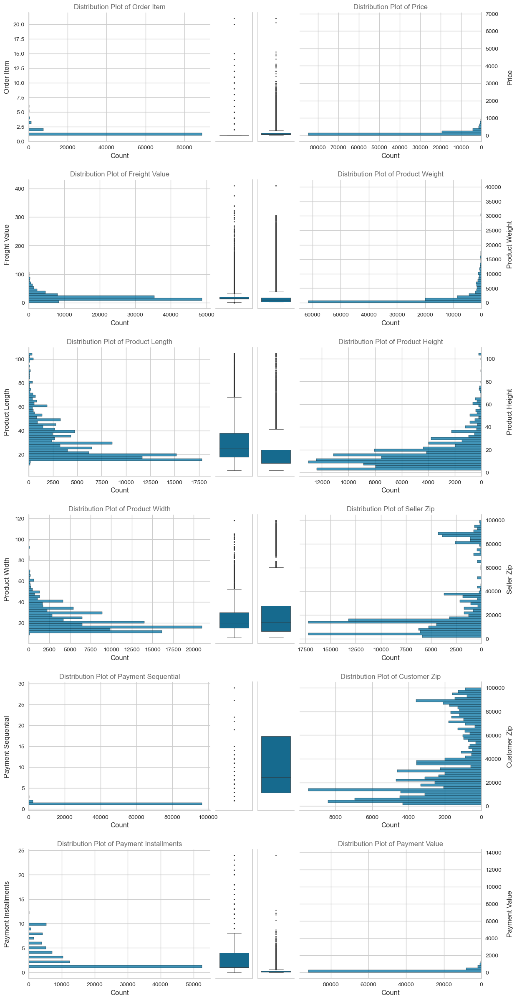

In [37]:
# Menampilkan Plot Distribusi untuk Fitur Numerik dalam Dataframe Order History dan Customer Payments
selection = np.array(list(order_history.drop('review_score', axis=1).describe().columns) +
                     list(customer_payments.describe().columns))
on_left, on_right = selection[np.r_[0, 2, 4, 6, 9, 10]], selection[np.r_[1, 3, 5, 7, 8, 11]]

fig, axes = plt.subplots(
    nrows=int(len(selection) / 2),
    ncols=4,
    figsize=(14, int(5 * len(selection) / 2)),
    gridspec_kw={
        'height_ratios': [1] * int(len(selection) / 2),
        'width_ratios': [5, 1, 1, 5],
        'wspace': .05,
        'hspace': .3
    }
)

for n, nums in enumerate(selection):
    y_axis = order_history.groupby('order_id')[nums].max() if nums == 'order_item_id' else \
        order_history[nums] if n < 9 else \
            customer_payments.groupby('order_id')[nums].max() if nums == 'payment_sequential' else \
                customer_payments[nums]

    def create_histplot(on):
        return sns.histplot(
            y=y_axis,
            ax=axes[floor(n / 2), 0 if on == 'left' else 3],
            bins=50
        )

    def create_boxplot(on):
        return sns.boxplot(
            y=y_axis,
            ax=axes[floor(n / 2), 1 if on == 'left' else 2],
            linewidth=0.5,
            fliersize=1
        )

    def control_histplot(plot, on):
        sequence = ['top', 'right', 'left', 'bottom'] if on == 'left' else \
            ['top', 'left', 'right', 'bottom']
        plot.set_ylabel(' '.join(nums.split('_')[:2]).title())
        plot.yaxis.set_label_coords(-.1 if on == 'left' else 1.175, .5)
        plot.set_title(
            'Distribution Plot of ' + ' '.join(nums.split('_')[:2]).title(),
            size=12,
            color='dimgrey'
        )

        if on == 'right':
            plot.yaxis.tick_right()
            x_limits = plot.get_xlim()
            plot.set_xlim((x_limits[1], x_limits[0]))

        for i, loc in enumerate(sequence):
            plot.spines[loc].set_visible(False if i < 2 else True)
            plot.spines[loc].set_color('#CCCCCC')

    def control_boxplot(plot, on):
        sequence = ['left', 'top', 'bottom', 'right'] if on == 'left' else \
            ['right', 'top', 'bottom', 'left']
        plot.set_xlabel('Boxplot')
        plot.xaxis.set_visible(False)
        plot.yaxis.set_visible(False)

        for i, loc in enumerate(sequence):
            plot.spines[loc].set_visible(False if i < 2 else True)
            plot.spines[loc].set_color('#CCCCCC')

    if nums in on_left:
        control_histplot(plot=create_histplot(on='left'), on='left')
        control_boxplot(plot=create_boxplot(on='left'), on='left')

    if nums in on_right:
        control_histplot(plot=create_histplot(on='right'), on='right')
        control_boxplot(plot=create_boxplot(on='right'), on='right')


Berdasarkan pemeriksaan visual untuk kolom-kolom numerik, seperti yang dapat kita lihat, sebagian besar kolom numerik ditunjukkan dengan Distribusi Skew Positif. Jadi dapat disimpulkan bahwa data dalam kolom-kolom ini tidak terdistribusi normal.

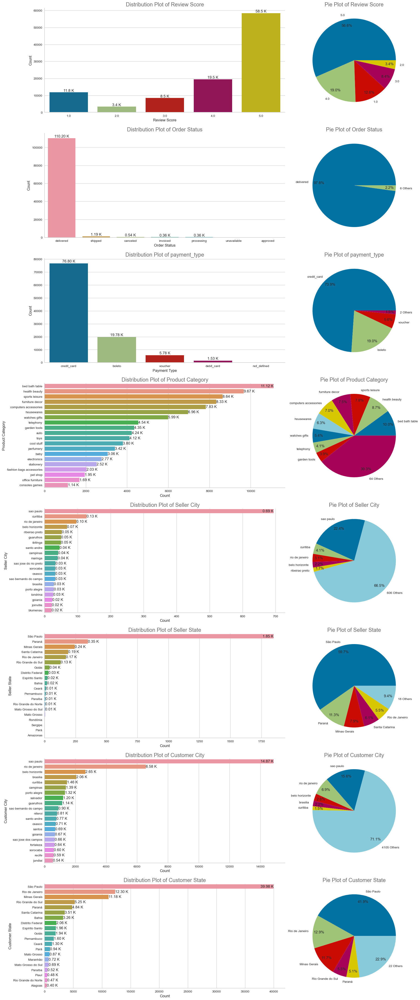

In [38]:
# Menampilkan plot distribusi dan pie untuk fitur kategorikal dalam Dataframe Order History dan Customer Payments
col_list = ['review_score', 'order_status', 'payment_type', 'product_category_name',
            'seller_city', 'seller_state', 'customer_city', 'customer_state']

fig, axes = plt.subplots(
    nrows=len(col_list),
    ncols=2,
    figsize=(21, 7 * len(col_list)),
    gridspec_kw={
        'width_ratios': [2, 1],
        'wspace': .05,
        'hspace': .2
    }
)

clause_dictionary = {
    0: [0, 0, 50, 1000, 'Review Score', 0],
    1: [1, 6, 5, 2000, 'Order Status', 0],
    2: [3, 2, 4, 1500, 'payment_type', 1],
    3: [9, 64, 50, 0, 'Product Category', 0],
    4: [5, 606, 50, 0, 'Seller City', 0],
    5: [5, 18, 15, 500, 'Seller State', 0],
    6: [5, 4105, 50, 0, 'Customer City', 0],
    7: [5, 22, 50, 0, 'Customer State', 0]
}

for i, col in enumerate(col_list):
    clause = clause_dictionary.setdefault(i)
    id_set = 'seller_id' if 4 <= i <= 5 else 'customer_unique_id' if i > 5 else ''
    dataset = [order_history, customer_payments]
    count_aggregate = pd.DataFrame(
        dataset[clause[5]].groupby(['order_id', 'product_id'])[col].max().value_counts().sort_index() if i == 0 else
        dataset[clause[5]][col].value_counts().sort_values(ascending=False) if i < 4 else
        dataset[clause[5]].groupby(col)[id_set].nunique().sort_values(ascending=False)
    )

    barplot = sns.barplot(
        count_aggregate if i < 3 else count_aggregate.head(20),
        x=count_aggregate.index if i < 3 else col if i < 4 else id_set,
        y=col if i < 3 else count_aggregate.head(20).index,
        ax=axes[i, 0]
    )

    for k, val in enumerate(count_aggregate[col if i < 4 else id_set]):
        if k < clause[2]:
            axes[i, 0].annotate(
                f'{(val) / 1000:,.2f} K' if i != 0 else f'{(val) / 1000:,.1f} K',
                xy=(k, val + clause[3]) if i < 3 else (val + clause[3], k) if i != 5 else (val, k),
                ha='center' if i < 3 else 'left' if k > 0 else 'right',
                va='center'
            )

    sns.despine()
    axis_name = ' '.join(col.split('_')[:2]).title()
    barplot.set_xlabel(axis_name if i < 3 else 'Count'), barplot.set_ylabel('Count' if i < 3 else axis_name)
    barplot.set_title(
        f'Distribution Plot of {clause[4]}',
        size=17,
        color='dimgrey'
    )

    for loc in ['left', 'bottom']:
        barplot.spines[loc].set_color('#CCCCCC')

    axes[i, 1].pie(
        x=list(count_aggregate[id_set][:clause[0]]) + [sum(count_aggregate[id_set][clause[0]:])] if i >= 4 else
        list(dataset[clause[5]]['review_score'].value_counts()) if i == 0 else
        list(dataset[clause[5]][col].value_counts()[:clause[0]]) + \
        [sum(dataset[clause[5]][col].value_counts()[clause[0]:])],
        labels=list(dataset[clause[5]]['review_score'].value_counts().index) if i == 0 else
        list(count_aggregate.index[:clause[0]]) + [f'{clause[1]} Others'] if i >= 4 else
        list(dataset[clause[5]][col].value_counts()[:clause[0]].index) + \
        [f'{clause[1]} Others'],
        autopct='%.1f%%',
        pctdistance=0.85,
        startangle=75 if i == 4 or i == 6 else 0
    )

    axes[i, 1].set_title(
        f'Pie Plot of {clause[4]}',
        size=17,
        color='dimgrey'
    )


- Dari distribusi Review_score dan plot pie, terlihat bahwa 5 bintang adalah skor yang paling banyak diberikan oleh pelanggan kepada produk yang mereka pesan di Olist, mencapai 56,6% dari total ulasan.
- Dalam distribusi Order_status dan plot pie, terlihat bahwa "delivered" adalah status yang paling banyak dilaporkan ke sistem di Olist, mencapai 97,8% dari total pesanan.
- Dalam distribusi Payment_types dan plot pie, terlihat bahwa kartu kredit adalah jenis pembayaran yang paling umum digunakan oleh konsumen dalam transaksi di Olist, mencapai 73,9% dibandingkan dengan jenis pembayaran lainnya.
- Dalam distribusi Product_category dan plot pie, terlihat bahwa bed bath table, health beauty, dan sport leisure adalah 3 kategori produk yang paling banyak dibeli di e-commerce Olist dengan masing-masing 10%, 8,7%, dan 7,8% dari total. Sementara itu, ada 64 produk lain yang tidak terkategori dengan 39,3% dari total.
- Berdasarkan Seller_city dan Seller_state, terlihat bahwa Sao Paulo adalah tempat transaksi paling banyak terjadi di 1 kota dan 1 negara bagian, mencapai 22,4% dan 59,7% dibandingkan dengan kota dan negara bagian lainnya. Begitu juga dengan Customer_city dan Customer_state, Sao Paulo adalah kota dan negara bagian di mana sebagian besar pelanggan berasal, dengan 15,6% dan 41,9% dari total.

# Cleaning Data

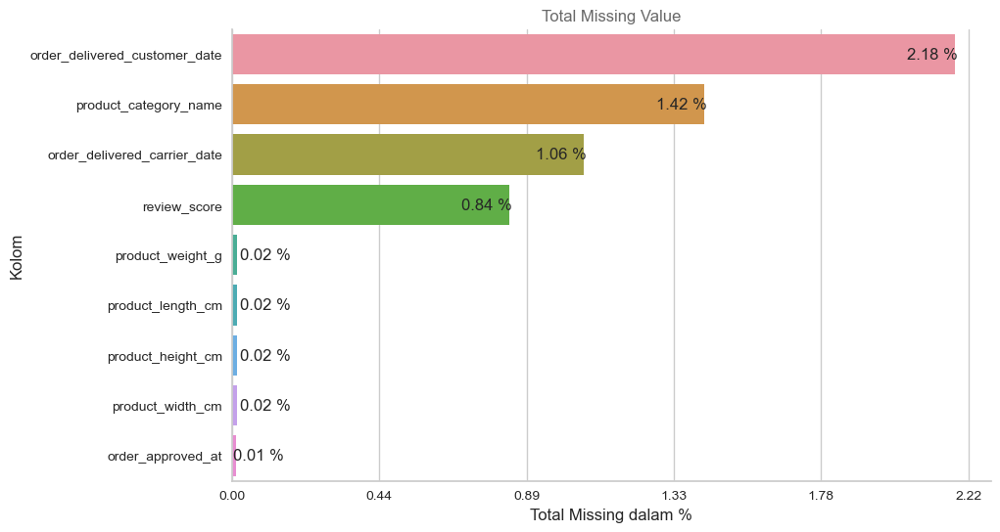

In [40]:
# Menampilkan Plot Total Missing Value dari DataFrame Order History
missing_info = order_history.isnull().sum()
missing_info = missing_info[missing_info != 0].sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10, 6))

barplot = sns.barplot(
    x=missing_info.values,
    y=missing_info.index,
    ax=ax,
)

for i, val in enumerate(missing_info.values):
    ax.text(
        val + 10 if i < 8 else val - 10,
        i,
        f'{100 * (val / order_history.shape[0]):,.2f} %',
        ha='right' if i < 4 else 'left',
        va='center'
    )

sns.despine()
ax.spines['left'].set_color('#CCCCCC')
ax.spines['bottom'].set_color('#CCCCCC')
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda x, y: f'{x / order_history.shape[0] * 100:.2f}'))
ax.set_xlabel('Total Missing dalam %')
ax.set_ylabel('Kolom')
ax.set_title('Total Missing Value', size=12, color='dimgrey')

plt.show()


Berdasarkan plot total missing value di atas, dapat dilihat bahwa order_delivered_customer_date adalah data dengan Missing Value terbanyak dalam DataFrame Order History, yaitu sebesar 2.18%, diikuti oleh product_category_name dengan 1.42%, order_delivered_carrier_date dengan 1.06%, dan review_score dengan 0.84%. Setiap kolom ini harus dibersihkan agar model yang akan dibangun tidak bias.


Text(0.5, 1.0, 'Missingness Correlation dari Order History\n')

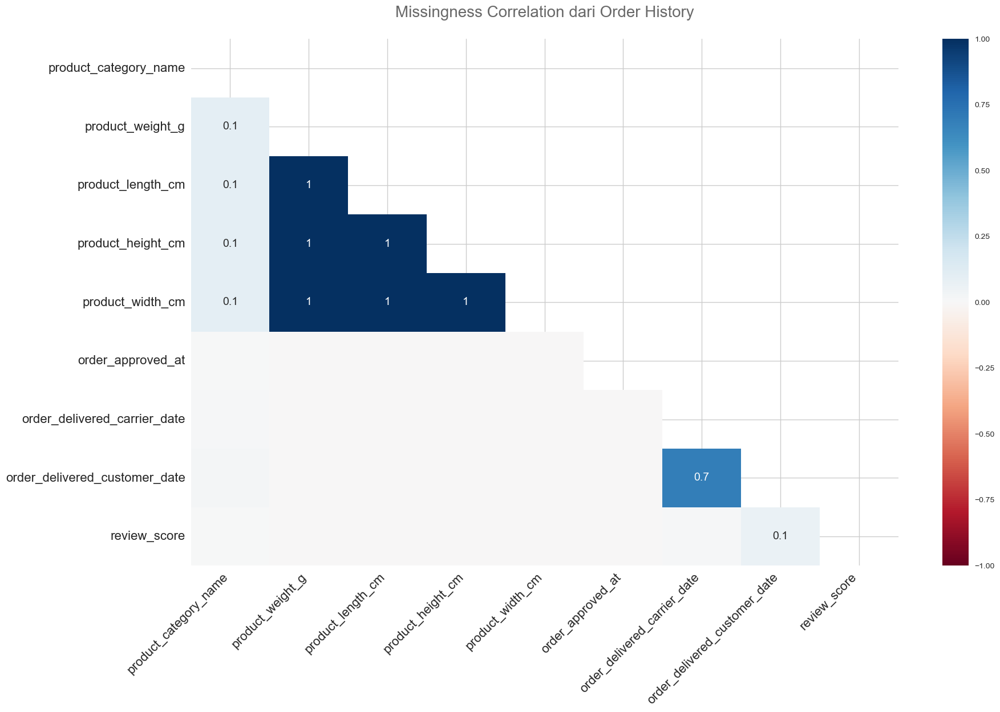

In [41]:
# Menampilkan Heatmap Missing No dari DataFrame Order History
missingno.heatmap(order_history)
plt.title(
    'Missingness Correlation dari Order History\n',
    size=20,
    color='dimgrey'
)


Berdasarkan Heatmap di atas, terlihat bahwa product_length_cm, product_heigth_cm, product_width_cm memiliki korelasi yang kuat satu sama lain. Korelasi terkuat kedua adalah antara kolom order_delivered_customer_date dengan order_delivered_carrier_date dengan nilai 0.7.

In [42]:
# Menampilkan Missing Value pada kolom order_approved_at dari DataFrame Order History
missing_approved_at = order_history[order_history['order_approved_at'].isnull()]
display(missing_approved_at[['order_id', 'product_id', 'seller_id', 'order_approved_at']].head())
missing_approved_at.info(verbose=False)


,order_id,product_id,seller_id,order_approved_at
8204,12a95a3c06dbaec84bcfb0e2da5d228a,c6dd917a0be2a704582055949915ab32,7a67c85e85bb2ce8582c35f2203ad736,NaT
19005,2babbb4b15e6d2dfe95e2de765c97bce,c6dd917a0be2a704582055949915ab32,7a67c85e85bb2ce8582c35f2203ad736,NaT
20473,2eecb0d85f281280f79fa00f9cec1a95,4fd676d9c4723d475026e40aeae56957,5fd924b4836098a5be0ecf81ba054ce0,NaT
26393,3c0b8706b065f9919d0505d3b3343881,db8ed3d08891d16a2438a67ab3acb740,004c9cd9d87a3c30c522c48c4fc07416,NaT
36128,51eb2eebd5d76a24625b31c33dd41449,7868a64aa111bbb4f41f8e1146c0becb,cca3071e3e9bb7d12640c9fbe2301306,NaT


<class 'pandas.core.frame.DataFrame'>
Int64Index: 15 entries, 8204 to 98863
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 3.2+ KB


In [43]:
# Menghapus fitur order_approved_at dari DataFrame Order History
order_history.dropna(subset=['order_approved_at'], inplace=True)


In [44]:
# Menampilkan Missing Value pada fitur product_weight_g, product_length_cm, product_height_cm, dan product_width_cm dari DataFrame Order History
display(order_history[order_history['product_weight_g'].isnull()][['product_weight_g','product_length_cm','product_height_cm','product_width_cm']].head())
order_history[order_history['product_weight_g'].isnull()].info(verbose=False)


,product_weight_g,product_length_cm,product_height_cm,product_width_cm
7098,NaN,NaN,NaN,NaN
9233,NaN,NaN,NaN,NaN
28715,NaN,NaN,NaN,NaN
28716,NaN,NaN,NaN,NaN
39299,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 18 entries, 7098 to 103715
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 3.8+ KB


In [45]:
# Menampilkan Missing Value pada fitur product_weight_g dengan unique product_id
for product_id in order_history[order_history['product_weight_g'].isnull()]['product_id'].unique():
    display(products[products['product_id'] == product_id][['product_id', 'product_category_name', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm']])


,product_id,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN


,product_id,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,baby,NaN,NaN,NaN,NaN


In [46]:
# Menghapus fitur product_weight_g yang memiliki Missing Value dari DataFrame Order History
order_history.dropna(subset=['product_weight_g'], inplace=True)

In [47]:
# Menampilkan Missing Value pada fitur product_category_name dengan order_id dan product_id yang unik
missing_product_category = order_history[order_history['product_category_name'].isnull()]
display(missing_product_category[['order_id', 'product_id', 'product_category_name']].head())

# Menampilkan informasi terkait Missing Value pada fitur product_category_name
missing_product_category.info(verbose=False)


,order_id,product_id,product_category_name
123,0046e1d57f4c07c8c92ab26be8c3dfc0,ff6caf9340512b8bf6d2a2a6df032cfa,NaN
125,00482f2670787292280e0a8153d82467,a9c404971d1a5b1cbc2e4070e02731fd,NaN
132,004f5d8f238e8908e6864b874eda3391,5a848e4ab52fd5445cdc07aab1c40e48,NaN
142,0057199db02d1a5ef41bacbf41f8f63b,41eee23c25f7a574dfaf8d5c151dbb12,NaN
171,006cb7cafc99b29548d4f412c7f9f493,e10758160da97891c2fdcbc35f0f031d,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1585 entries, 123 to 112501
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 334.3+ KB


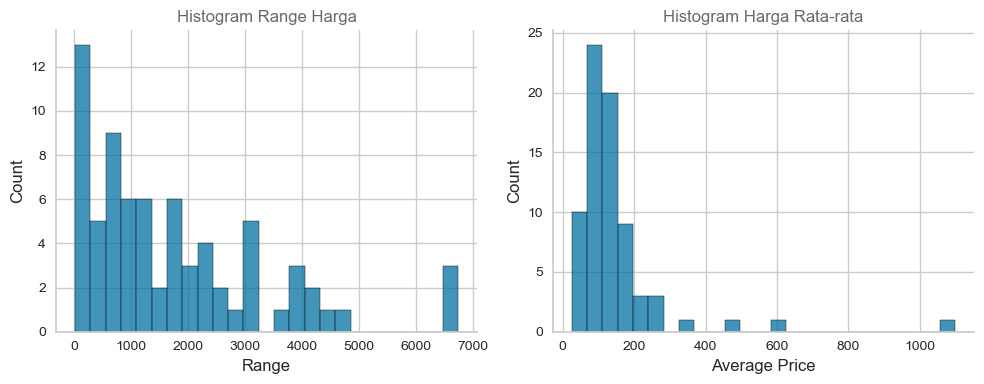

In [49]:
# Menampilkan Histogram Range dan Harga Rata-rata
products = []

for prod in list(order_history['product_category_name'].dropna().unique()):
    products.append(prod)

prod_df = pd.DataFrame({
    'Product': products,
    'Minimal Price': order_history.groupby('product_category_name')['price'].min(),
    'Maximal Price': order_history.groupby('product_category_name')['price'].max(),
    'Average Price': order_history.groupby('product_category_name')['price'].mean()
})

prod_df['Range'] = prod_df['Maximal Price'] - prod_df['Minimal Price']

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

for i, col in enumerate(['Range', 'Average Price']):
    sns.histplot(prod_df[col], ax=axes[i], bins=25)
    sns.despine()
    axes[i].spines['bottom'].set_color('#CCCCCC')
    axes[i].spines['left'].set_color('#CCCCCC')
    plt.tight_layout()
    axes[i].set_title(
        'Histogram Range Harga' if i == 0 else 'Histogram Harga Rata-rata',
        size=12,
        color='dimgrey'
    )

In [50]:
# Menggantikan Missing Value pada kolom product_category_name dengan nilai 'others'
order_history['product_category_name'].fillna('others', inplace=True)


In [51]:
# Menampilkan Missing Value pada kolom review_score beserta informasi uniknya
display(order_history[order_history['review_score'].isnull()][['order_id', 'product_id', 'product_category_name', 'review_score']])
order_history[order_history['review_score'].isnull()].info(verbose=False)

,order_id,product_id,product_category_name,review_score
32,00143d0f86d6fbd9f9b38ab440ac16f5,e95ee6822b66ac6058e2e4aff656071a,sports leisure,NaN
33,00143d0f86d6fbd9f9b38ab440ac16f5,e95ee6822b66ac6058e2e4aff656071a,sports leisure,NaN
34,00143d0f86d6fbd9f9b38ab440ac16f5,e95ee6822b66ac6058e2e4aff656071a,sports leisure,NaN
89,00335b686d693c7d72deeb12f8e89227,87b08e712cc4c9fe70984c5a24b29e2f,toys,NaN
256,00a77f9cc25b05b2004752593d7b8888,33bd5538a16d23f0a39da1c9bfd20980,home confort,NaN
...,...,...,...,...
112217,feef9f21cf88daf192de972212d1c5d5,404a57563d487aecbc2b1a01d9b89aab,bed bath table,NaN
112233,fefacc66af859508bf1a7934eab1e97f,69c590f7ffc7bf8db97190b6cb6ed62e,computers,NaN
112289,ff18b518679a92dcb00e16fae93c6d59,461f43be3bdf8844e65b62d9ac2c7a5a,watches gifts,NaN
112396,ff5b7f440481674b38554434638beebf,f0354861ab19941a53209c2acbb1b604,toys,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 942 entries, 32 to 112584
Columns: 26 entries, order_id to customer_state
dtypes: datetime64[ns](5), float64(7), int64(3), object(11)
memory usage: 198.7+ KB


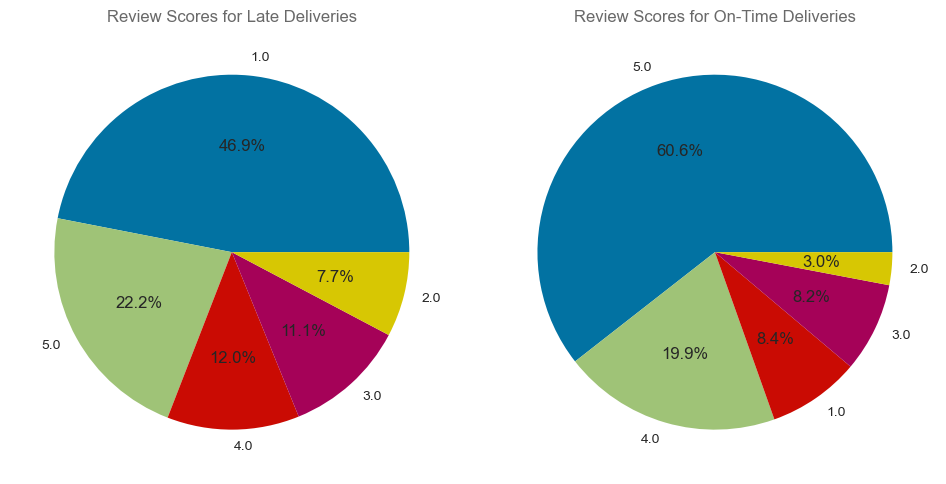

In [52]:
# Menampilkan 2 Diagram Pie untuk review_score pada Pengiriman yang Terlambat dan Tepat Waktu
order_history['delivery_length'] = order_history['order_delivered_customer_date'] - order_history['order_purchase_timestamp']
order_history['faster_within'] = order_history['order_estimated_delivery_date'] - order_history['order_delivered_customer_date']

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

for i in range(2):
    data = order_history[order_history['faster_within'].dt.days < 0] if i == 0 else \
        order_history[order_history['faster_within'].dt.days >= 0]

    axes[i].pie(
        data['review_score'].value_counts(),
        labels=data['review_score'].value_counts().index,
        autopct='%1.1f%%'
    )
    title_text = 'Late Deliveries' if i == 0 else 'On-Time Deliveries'
    plt.tight_layout()
    axes[i].set_title(
        f'Review Scores for {title_text}',
        size=12,
        color='dimgrey'
    )


Berdasarkan dua diagram pie di atas, terlihat bahwa pelanggan cenderung memberikan rating 1 bintang pada pengiriman yang terlambat dan memberikan rating 5 bintang pada pengiriman yang tepat waktu.

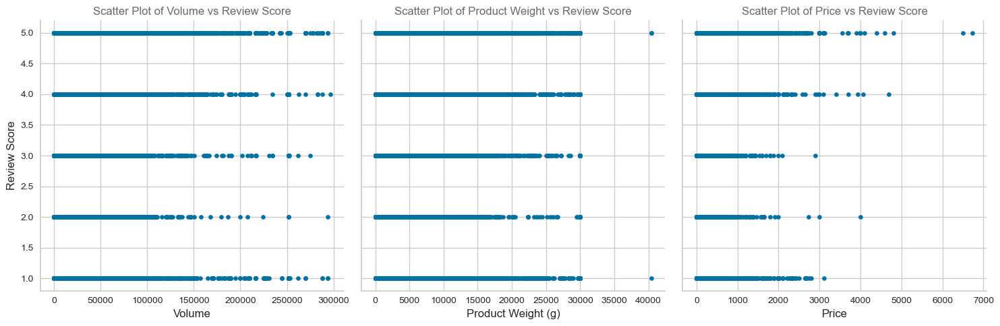

In [53]:
# Menampilkan Volume, Product Weight, and Price vs Review Score Scatter Plot
order_history['volume'] = order_history['product_height_cm'] * order_history['product_width_cm'] * order_history['product_length_cm']

fig, axes = plt.subplots(
    nrows=1,
    ncols=3,
    figsize=(15, 5),
    sharey=True
)

for i, col in enumerate(['volume', 'product_weight_g', 'price']):
    scatter = order_history.plot.scatter(
        x=col,
        y='review_score',
        ax=axes[i]
    )

    prompt = 'Volume' if i == 0 else 'Price' if i == 2 else 'Product Weight'
    axes[i].set_ylabel('Review Score')
    axes[i].set_xlabel('{}{}'.format(prompt, '' if i != 1 else ' (g)'))
    axes[i].set_title(
        f'Scatter Plot of {prompt} vs Review Score',
        size=12,
        color='dimgrey'
    )

    for i in ['left', 'bottom']:
        scatter.spines[i].set_color('#CCCCCC')

    sns.despine()
    plt.tight_layout()


Text(0.5, 1.0, 'Correlation Heatmap\n')

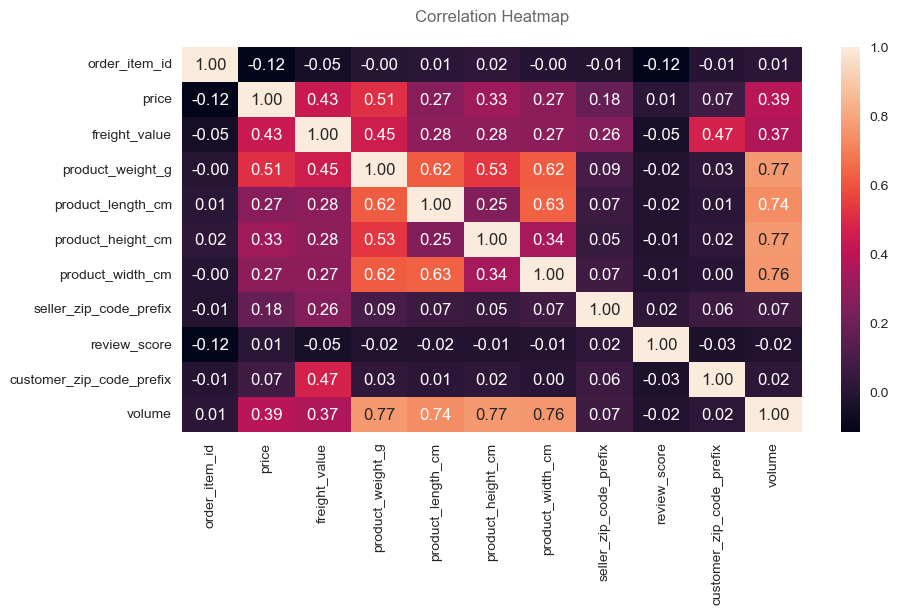

In [54]:
# Tampilkan Heatmap Korelasi dari Fitur-fitur pada Order History dengan Metode Spearman
plt.figure(figsize=(10, 5))
sns.heatmap(
    order_history.corr(numeric_only=True, method='spearman'),
    annot=True,
    fmt='.2f'
)
plt.title(
    'Correlation Heatmap\n',
    size=12,
    color='dimgrey'
)


In [57]:
# Tampilkan nilai p dari uji kruskal
product_category_score = order_history[
    (order_history['product_category_name'].notnull()) & (order_history['review_score'].notnull())
]

group = [
    product_category_score[product_category_score['product_category_name'] == category]['review_score']
    for category in product_category_score['product_category_name'].unique()
]

result = kruskal(*group)

threshold = 0.05
is_significant = result.pvalue < threshold

difference_clause = 'setidaknya dua kategori' if is_significant else ''
significance_clause = 'signifikan' if is_significant else 'tidak signifikan'

print(f'Nilai p {"di bawah" if is_significant else "di atas"} {threshold}, menunjukkan perbedaan yang {significance_clause}',
      f'antara {difference_clause} dari produk',
      'untuk pengukuran skor ulasan.')


Nilai p di bawah 0.05, menunjukkan perbedaan yang signifikan antara setidaknya dua kategori dari produk untuk pengukuran skor ulasan.


In [58]:
# Mengubah tipe data review_score menjadi float dan mengganti Missing Value dengan nilai rata-rata
order_history['review_score'] = order_history['review_score'].astype('float')

# Menghitung rata-rata skor ulasan untuk setiap kategori produk dan ID produk
category_score_dictionary = round(
    order_history.groupby(['product_category_name', 'product_id'])['review_score'].mean()
).to_dict()

# Mendefinisikan fungsi untuk memetakan Missing Value Review berdasarkan kategori produk dan ID produk
def review_score_mapping(cols):
    try:
        return category_score_dictionary[(cols[0], cols[1])]
    except:
        return np.nan

# Mengidentifikasi dan mengganti Missing Value menggunakan fungsi pemetaan
review_null = order_history['review_score'].isnull()
order_history.loc[review_null, 'review_score'] = order_history[review_null]\
    [['product_category_name', 'product_id']].apply(review_score_mapping, axis=1)

# Menghapus baris dengan Missing Value setelah pemetaan
order_history.drop(
    index=order_history[order_history['review_score'].isnull()].index,
    inplace=True
)


In [59]:
# Menampilkan dan mencatat informasi order_delivered_carrier_date yang memiliki nilai lebih kecil dari order_purchase_timestamp
display(order_history[order_history['order_delivered_carrier_date'] < order_history['order_purchase_timestamp']][[
    'order_purchase_timestamp', 'order_delivered_carrier_date'
]].head())
order_history[order_history['order_delivered_carrier_date'] < order_history['order_purchase_timestamp']].info(verbose=False)

# Menghapus baris dengan order_delivered_carrier_date yang memiliki nilai lebih kecil dari order_purchase_timestamp
order_history.drop(
    index=order_history[order_history['order_delivered_carrier_date'] < order_history['order_purchase_timestamp']].index,
    inplace=True
)


,order_purchase_timestamp,order_delivered_carrier_date
344,2018-06-11 12:24:48,2018-06-11 12:05:00
575,2018-05-15 15:13:06,2018-05-15 14:58:00
1960,2018-08-08 13:18:36,2018-08-08 12:19:00
3516,2018-08-06 09:17:53,2018-08-06 08:44:00
3824,2018-06-27 11:16:44,2018-06-27 10:57:00


<class 'pandas.core.frame.DataFrame'>
Int64Index: 185 entries, 344 to 112564
Columns: 29 entries, order_id to volume
dtypes: datetime64[ns](5), float64(8), int64(3), object(11), timedelta64[ns](2)
memory usage: 43.4+ KB


In [60]:
# Menampilkan Missing Value pada order_delivered_customer_date dan order_delivered_carrier_date
null_date = (order_history['order_delivered_customer_date'].isnull()) | (order_history['order_delivered_carrier_date'].isnull())

display(order_history[null_date].head())
order_history[null_date].info(verbose=False)


,order_id,order_item_id,product_id,price,freight_value,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,review_score,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,delivery_length,faster_within,volume
79,002f19a65a2ddd70a090297872e6d64e,1,9eae06d51aaa383b2bed5547a19d581c,53.98,23.31,bed bath table,800.0,16.0,10.0,16.0,1835b56ce799e6a4dc4eddc053f04066,14940,ibitinga,São Paulo,shipped,2018-03-21 13:05:30,2018-03-21 13:15:27,2018-03-22 00:13:35,NaT,2018-04-16,3.0,7fa80efb1ef15ca4104627910c29791c,205d5aa158338f2b733a07326aae8c87,42804,camacari,Bahia,NaT,NaT,2560.0
84,00310b0c75bb13015ec4d82d341865a4,1,c8e7c2ef329fcda4a233e7e2f8bb8b7d,39.90,15.38,housewares,200.0,16.0,12.0,11.0,a2deecd5398f5df4987110c80a1972a3,5043,sao paulo,São Paulo,canceled,2018-08-15 14:29:08,2018-08-15 15:04:25,NaT,NaT,2018-08-29,1.0,0dad07848c618cc5a4679a1bfe1db8d2,ec979208947bbba310f2ad8e50963725,31160,belo horizonte,Minas Gerais,NaT,NaT,2112.0
260,00a99c50fdff7e36262caba33821875a,1,76d75f398634bf194ba99d7297e7d1fa,52.99,22.30,computers accessories,350.0,25.0,11.0,15.0,974cf2cb8f4b7add98709c30df02fe10,14802,araraquara,São Paulo,shipped,2018-08-17 16:25:04,2018-08-17 16:35:18,2018-08-18 09:07:00,NaT,2018-09-18,5.0,7a399396442d5601cbedfbd0a3cf1da4,60ec651482858c327c177cf9360cc0a2,45990,teixeira de freitas,Bahia,NaT,NaT,4125.0
270,00ae7a8b4936674ebb701d4a23719a79,1,66f09a6de4f2ef63aaf5349b60a0e0c0,27.90,9.26,auto,600.0,16.0,11.0,11.0,bf0d50a6410d487dc97d2baac0a8c0be,13408,piracicaba,São Paulo,canceled,2018-05-09 14:14:06,2018-05-09 15:51:32,NaT,NaT,2018-05-17,2.0,a7e8a3cb55d9c9a536992c6465a46a3f,f0b9f688a3b9151bc6b38f4b5b36ea44,6539,santana de parnaiba,São Paulo,NaT,NaT,1936.0
422,00ff0cf5583758e6964723e42f111bf4,1,bb1fe952bdc16ef8974d4ca11aec19b7,154.90,15.25,health beauty,417.0,16.0,15.0,14.0,b17b679f4f5ce2e03ce6968c62648246,14090,ribeirao preto,São Paulo,canceled,2017-04-10 00:45:56,2017-04-10 01:03:29,NaT,NaT,2017-05-04,1.0,e3626ed5d1f2e3a02d692ec948b25eeb,b9badb100ff8ecc16a403111209e3a06,88025,florianopolis,Santa Catarina,NaT,NaT,3360.0


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2433 entries, 79 to 112421
Columns: 29 entries, order_id to volume
dtypes: datetime64[ns](5), float64(8), int64(3), object(11), timedelta64[ns](2)
memory usage: 570.2+ KB


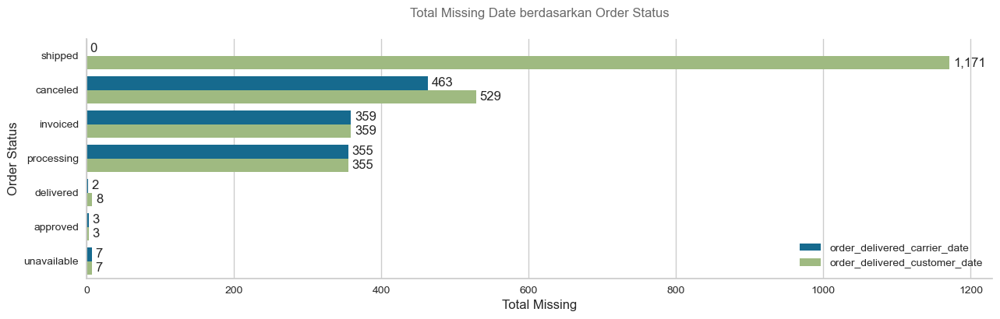

In [63]:
# Menggambar grafik batang untuk Total Missing Date berdasarkan Order Status
total_list = []
status_list = []

for i in order_history[null_date]['order_status'].unique():
    count = order_history[order_history['order_status']==i][[
        'order_delivered_carrier_date','order_delivered_customer_date'
    ]].isnull().sum()

    for j in range(len(count)):
        total_list.append(count[j])
        status_list.append(i)

info_list = ['order_delivered_carrier_date','order_delivered_customer_date']*7

count_missing_df = pd.DataFrame(
    data=[
        total_list,
        status_list,
        info_list
    ]).transpose().rename(
        columns={
            0:'Total Missing',
            1:'Order Status',
            2:'Date Info'
        }
    )

plt.figure(figsize=(15,4))

barplot = sns.barplot(
    count_missing_df,
    x='Total Missing',
    y='Order Status',
    hue='Date Info'
)

for i, val in enumerate(count_missing_df['Total Missing']):
    plt.annotate(
        f'{val:,.0f}',
        xy=(val+5,(i/2)-0.05 if i%2 == 0 else (i/2)-0.125),
        ha='left',
        va='bottom'
    )

for i in ['left','bottom']:
    barplot.spines[i].set_color('#CCCCCC')

sns.despine()
plt.legend(loc=4),
plt.title(
    'Total Missing Date berdasarkan Order Status',
    size=12,
    color='dimgrey',
    pad=20
)

plt.show()


Tidak ada Missing Value pada kolom order_delivered_carrier_date dengan status pesanan "shipped".

In [64]:
# Menampilkan fitur-fitur pada DataFrame Customer Payments yang memiliki Missing Value
missing_values_customer_payments = customer_payments.isnull().sum()
display(missing_values_customer_payments)


order_id                    0
customer_unique_id          0
order_purchase_timestamp    0
payment_sequential          1
payment_type                1
payment_installments        1
payment_value               1
dtype: int64

In [65]:
# Menghapus Missing Value pada kolom payment_sequential, payment_type, payment_installments, dan payment_value
customer_payments.dropna(axis=0, inplace=True)


In [66]:
# Membuat DataFrame baru bernama eda_df dengan nilai 'order_purchase_timestamp' yang dibagi menjadi kolom-kolom baru seperti 'year', 'month', dll.
eda_df = order_history.groupby('order_id')[[
    'order_id',
    'customer_unique_id','customer_zip_code_prefix','customer_city','customer_state',
    'seller_id','seller_zip_code_prefix','seller_city','seller_state',
    'order_purchase_timestamp'
]].head(1)

# Daftar kolom baru yang akan dibuat
cols = ['year','month','month_name','year_month','date','day','dayofweek','dayofweek_name','hour']

# Loop untuk membuat kolom baru berdasarkan nilai 'order_purchase_timestamp'
for i, col in enumerate(cols):
    eda_df['order_purchase_'+col] = eda_df['order_purchase_timestamp'].apply(
        lambda x: x.year if i == 0 else x.month if i == 1 else x.strftime('%b') if i == 2 else\
            x.strftime('%Y%m') if i == 3 else x.strftime('%Y%m%d') if i == 4 else x.day if i == 5 else\
                x.dayofweek if i == 6 else x.strftime('%a') if i == 7 else x.hour
    )

# Membuat kolom baru 'order_purchase_time_day' berdasarkan 'order_purchase_hour'
eda_df['order_purchase_time_day'] = pd.cut(
    x=eda_df['order_purchase_hour'],
    bins=[-0.1, 6, 12, 18, 23],
    labels=['Dawn','Morning','Afternoon','Night']
)

# Menampilkan lima baris pertama dari DataFrame baru
display(eda_df.head())

# Menampilkan informasi tentang DataFrame baru
eda_df.info(verbose=False)


,order_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,seller_id,seller_zip_code_prefix,seller_city,seller_state,order_purchase_timestamp,order_purchase_year,order_purchase_month,order_purchase_month_name,order_purchase_year_month,order_purchase_date,order_purchase_day,order_purchase_dayofweek,order_purchase_dayofweek_name,order_purchase_hour,order_purchase_time_day
0,00010242fe8c5a6d1ba2dd792cb16214,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,Rio de Janeiro,48436dade18ac8b2bce089ec2a041202,27277,volta redonda,São Paulo,2017-09-13 08:59:02,2017,9,Sep,201709,20170913,13,2,Wed,8,Morning
1,00018f77f2f0320c557190d7a144bdd3,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,São Paulo,dd7ddc04e1b6c2c614352b383efe2d36,3471,sao paulo,São Paulo,2017-04-26 10:53:06,2017,4,Apr,201704,20170426,26,2,Wed,10,Morning
2,000229ec398224ef6ca0657da4fc703e,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,Minas Gerais,5b51032eddd242adc84c38acab88f23d,37564,borda da mata,Minas Gerais,2018-01-14 14:33:31,2018,1,Jan,201801,20180114,14,6,Sun,14,Afternoon
3,00024acbcdf0a6daa1e931b038114c75,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,São Paulo,9d7a1d34a5052409006425275ba1c2b4,14403,franca,São Paulo,2018-08-08 10:00:35,2018,8,Aug,201808,20180808,8,2,Wed,10,Morning
4,00042b26cf59d7ce69dfabb4e55b4fd9,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,São Paulo,df560393f3a51e74553ab94004ba5c87,87900,loanda,Paraná,2017-02-04 13:57:51,2017,2,Feb,201702,20170204,4,5,Sat,13,Afternoon


<class 'pandas.core.frame.DataFrame'>
Int64Index: 98326 entries, 0 to 112649
Columns: 20 entries, order_id to order_purchase_time_day
dtypes: category(1), datetime64[ns](1), int64(7), object(11)
memory usage: 15.1+ MB


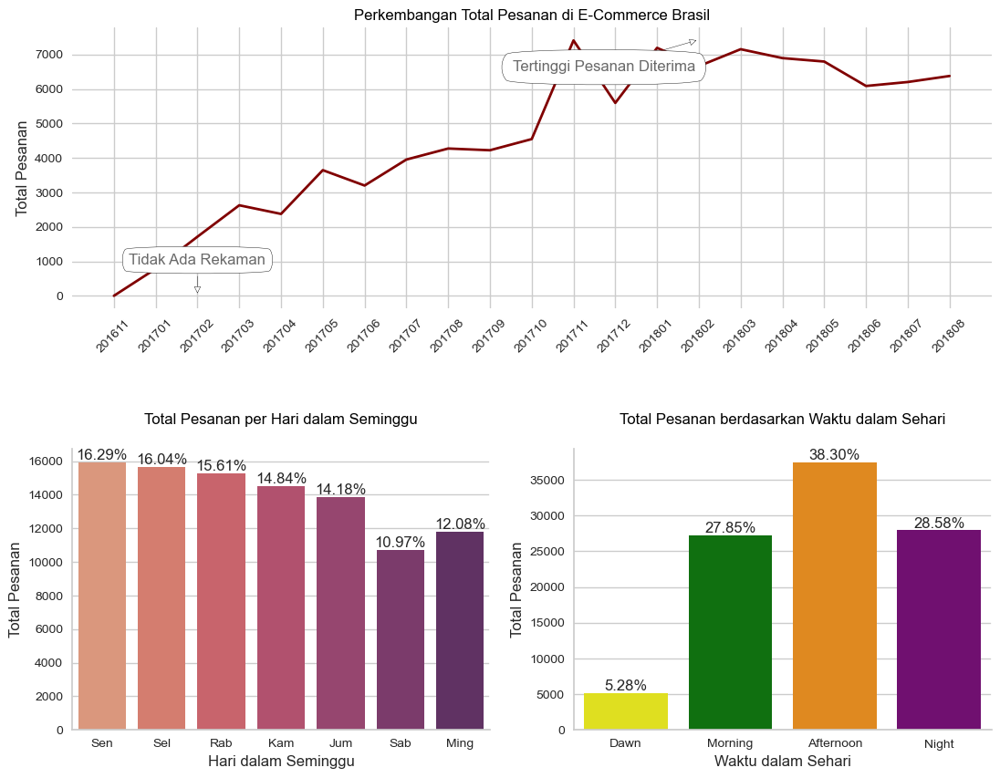

In [132]:
# Membuat Plot Perkembangan Total Pesanan di E-Commerce Brasil
fig = plt.figure(constrained_layout=True, figsize=(13, 10))

# Definisi Axis
gs = GridSpec(2, 2, figure=fig, hspace=.5)
ax1 = fig.add_subplot(gs[0,:])
ax2 = fig.add_subplot(gs[1,0])
ax3 = fig.add_subplot(gs[1,1])

# Lineplot - Perkembangan pesanan e-commerce sepanjang waktu
sns.lineplot(
    data=eda_df['order_purchase_year_month'].value_counts().append(
        pd.Series({'201611':0})
    ).sort_index(),
    ax=ax1,
    color='maroon',
    linewidth=2
)

ax1.annotate(
    f'Tertinggi Pesanan Diterima',
    xy=(14,7432),
    xytext=(-75,-25),
    textcoords='offset points',
    bbox=dict(
        boxstyle="round4",
        fc="w",
        pad=.8
    ),
    arrowprops=dict(
        arrowstyle='-|>',
        fc='w'
    ),
    color='dimgrey',
    ha='center'
)

ax1.annotate(
    f'Rekaman\nTidak Lengkap',
    xy=(24,0),
    xytext=(48,25),
    textcoords='offset points',
    bbox=dict(
        boxstyle="round4",
        fc="w",
        pad=.5
    ),
    arrowprops=dict(
        arrowstyle='-|>',
        fc='w'
    ),
    color='dimgrey',
    ha='center'
)

ax1.annotate(
    f'Tidak Ada Rekaman',
    xy=(2,0),
    xytext=(0,25),
    textcoords='offset points',
    bbox=dict(
        boxstyle="round4",
        fc="w",
        pad=.5
    ),
    arrowprops=dict(
        arrowstyle='-|>',
        fc='w'
    ),
    color='dimgrey',
    ha='center'
)

format_spines(ax1, right_border=False)

for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

ax1.set_title(
    'Perkembangan Total Pesanan di E-Commerce Brasil',
    size=12,
    color='black'
)

ax1.set_ylabel('Total Pesanan')

# Barchart - Total pesanan per hari dalam seminggu
single_countplot(
    eda_df,
    x='order_purchase_dayofweek',
    ax=ax2,
    order=False,
    palette='flare'
)

ax2.set_xlabel('Hari dalam Seminggu'), ax2.set_ylabel('Total Pesanan')
ax2.set_xticklabels(['Sen','Sel','Rab','Kam','Jum','Sab','Ming'])
ax2.set_title(
    'Total Pesanan per Hari dalam Seminggu',
    size=12,
    color='black',
    pad=20
)

# Barchart - Total pesanan berdasarkan waktu dalam sehari
single_countplot(
    eda_df,
    x='order_purchase_time_day',
    ax=ax3,
    order=False,
    palette=['yellow','green','darkorange','purple']
)

ax3.set_title(
    'Total Pesanan berdasarkan Waktu dalam Sehari',
    size=12,
    color='black',
    pad=20
)

ax3.set_xlabel('Waktu dalam Sehari')
ax3.set_ylabel('Total Pesanan')
plt.tight_layout()
plt.savefig('totalpesananhari.png')
plt.show()


- Tidak ada catatan pada November 2016 dan catatan yang tidak lengkap pada September 2018. Jumlah pesanan tertinggi diterima dalam satu bulan adalah pada November 2017.
- Berdasarkan total pesanan per hari dalam seminggu, Senin dan Selasa adalah hari dengan transaksi paling banyak dalam seminggu dengan masing-masing 16,29% dan 16,04% dari total.
- Dalam total pesanan berdasarkan waktu dalam sehari, dapat dilihat bahwa sore adalah waktu dengan transaksi paling banyak dalam sehari dengan 38,29% dari total. Ini mungkin terjadi karena lebih banyak pelanggan memiliki waktu luang selama istirahat makan siang. Yang kedua paling banyak adalah selama malam saat pelanggan memiliki lebih banyak waktu luang setelah sehari penuh bekerja.

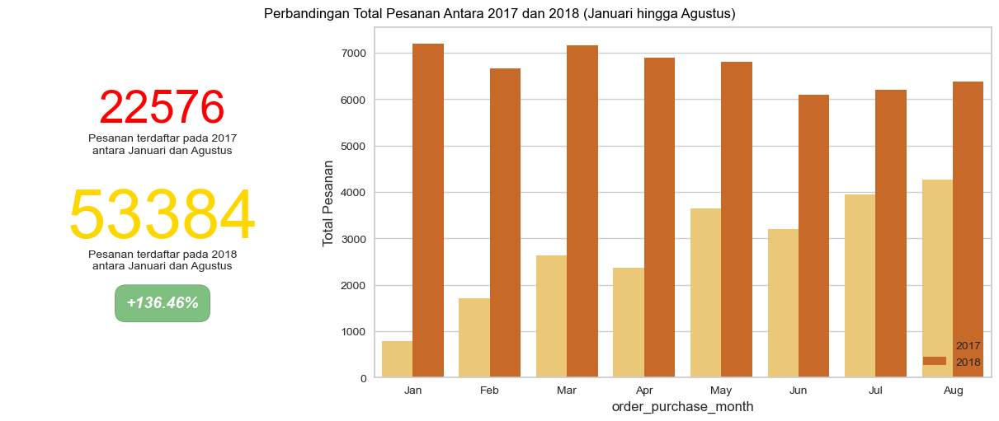

In [131]:
# Membuat Plot Perbandingan Total Pesanan Antara 2017 dan 2018 (Januari hingga Agustus)
fig = plt.figure(constrained_layout=True, figsize=(12, 5))

# Definisi Axis
gs = GridSpec(1, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])

# Anotasi - Pertumbuhan pada pesanan e-commerce antara 2017 dan 2018
df_orders_compare = eda_df.query('order_purchase_year in (2017, 2018) & order_purchase_month <= 8')
year_orders = df_orders_compare['order_purchase_year'].value_counts()
pertumbuhan = round(100*((year_orders[2018]-year_orders[2017])/year_orders[2017]),2)
ax1.text(
    x=0.5,
    y=0.73,
    s=f'{year_orders[2017]}',
    fontsize=40,
    color='red',
    ha='center'
)

ax1.text(
    x=0.5,
    y=0.64,
    s='Pesanan terdaftar pada 2017\nantara Januari dan Agustus',
    fontsize=10,
    ha='center'
)

ax1.text(
    x=0.5,
    y=0.40,
    s=f'{year_orders[2018]}',
    fontsize=60,
    color='gold',
    ha='center'
)

ax1.text(
    x=0.5,
    y=0.31,
    s='Pesanan terdaftar pada 2018\nantara Januari dan Agustus',
    fontsize=10,
    ha='center'
)

sinyal = '+' if pertumbuhan > 0 else '-'
ax1.text(
    x=0.5,
    y=0.20,
    s=f'{sinyal}{pertumbuhan}%',
    fontsize=14,
    ha='center',
    color='white',
    style='italic',
    weight='bold',
    bbox=dict(
        facecolor='green',
        alpha=0.5,
        pad=10,
        boxstyle='round, pad=.7'
    )
)

ax1.axis('off')

# Bar chart - Perbandingan penjualan bulanan antara 2017 dan 2018
sns.countplot(
    data=df_orders_compare,
    x='order_purchase_month',
    hue='order_purchase_year',
    ax=ax2,
    palette='YlOrBr'
)

ax2.set_xticklabels(['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug'])
ax2.set_ylabel('Total Pesanan')
plt.suptitle(
    'Perbandingan Total Pesanan Antara 2017 dan 2018 (Januari hingga Agustus)',
    size=12,
    color='black'
)

plt.legend(loc='lower right')
plt.savefig('totalpesanan.png')
plt.show()



Berdasarkan plot perbandingan di atas, dapat dilihat bahwa terjadi peningkatan pesanan sebesar 136.52% antara bulan Januari hingga Agustus tahun 2017 dengan bulan Januari hingga Agustus tahun 2018. Hal ini mungkin terjadi karena banyak pelanggan baru yang melakukan transaksi di Olist pada tahun 2018. Oleh karena itu, kasus ini sebaiknya diselidiki lebih lanjut dalam pemodelan.

In [74]:
# Filter order only dari Januari 2017
eda_df = eda_df[
    (eda_df['order_purchase_year_month'].astype(int) >= 201701) &
    (eda_df['order_purchase_year_month'].astype(int) <= 201808)
]

# Menggunakan API untuk mendapatkan informasi wilayah pada data
r = requests.get('https://servicodados.ibge.gov.br/api/v1/localidades/mesorregioes')
content = [c['UF'] for c in json.loads(r.text)]
br_info = pd.DataFrame(content).rename(
    columns={
        'sigla': 'state_code',
        'nome': 'state_name',
        'regiao': 'region'
    }
)

def english_region(cols):
    region_dict = {
        'Norte': 'North',
        'Nordeste': 'Northeast',
        'Sudeste': 'Southeast',
        'Sul': 'South',
        'Centro-Oeste': 'Midwest'
    }
    return region_dict.setdefault(cols)

br_info['region'] = br_info['region'].apply(lambda x: x['nome'])
br_info['region'] = br_info['region'].apply(english_region)
br_info.drop_duplicates(inplace=True)

# Menangani lokasi di luar peta Brasil
geo_prep = geo[geo.geolocation_lat <= 5.27438888]
geo_prep = geo_prep[geo_prep.geolocation_lng >= -73.98283055]
geo_prep = geo_prep[geo_prep.geolocation_lat >= -33.75116944]
geo_prep = geo_prep[geo_prep.geolocation_lng <= -34.79314722]
geo_group = geo_prep.groupby(
    'geolocation_zip_code_prefix', as_index=False
).mean()

eda_df = eda_df.merge(
    br_info[['state_name', 'region']],
    how='left',
    left_on='customer_state',
    right_on='state_name'
).drop('state_name', axis=1)

eda_df = eda_df.merge(
    geo_group,
    how='left',
    left_on='customer_zip_code_prefix',
    right_on='geolocation_zip_code_prefix'
).drop(
    'geolocation_zip_code_prefix', axis=1
).dropna(axis=0)

eda_df.drop(
    index=eda_df[eda_df['order_purchase_year_month'] == '201809'].index,
    inplace=True
)

# Mengelompokkan data berdasarkan wilayah
df_regions_group = eda_df.groupby(
    ['order_purchase_year_month', 'region'],
    as_index=False
).agg({
    'customer_unique_id': 'count'
}).sort_values(by='order_purchase_year_month')

df_regions_group.columns = ['month', 'region', 'order_count']
df_regions_group.reset_index(drop=True, inplace=True)

# Mengelompokkan data berdasarkan kota
df_cities_group = eda_df.groupby(
    'customer_city',
    as_index=False
).count().loc[:, ['customer_city', 'order_id']]

df_cities_group = df_cities_group.sort_values(
    'order_id',
    ascending=False
).reset_index(drop=True)

# Mengelompokkan data berdasarkan negara bagian
df_states_group = eda_df.groupby(
    'customer_state',
    as_index=False
).count().loc[:, ['customer_state', 'order_id']]

df_states_group = df_states_group.sort_values(
    'order_id',
    ascending=False
).reset_index(drop=True)


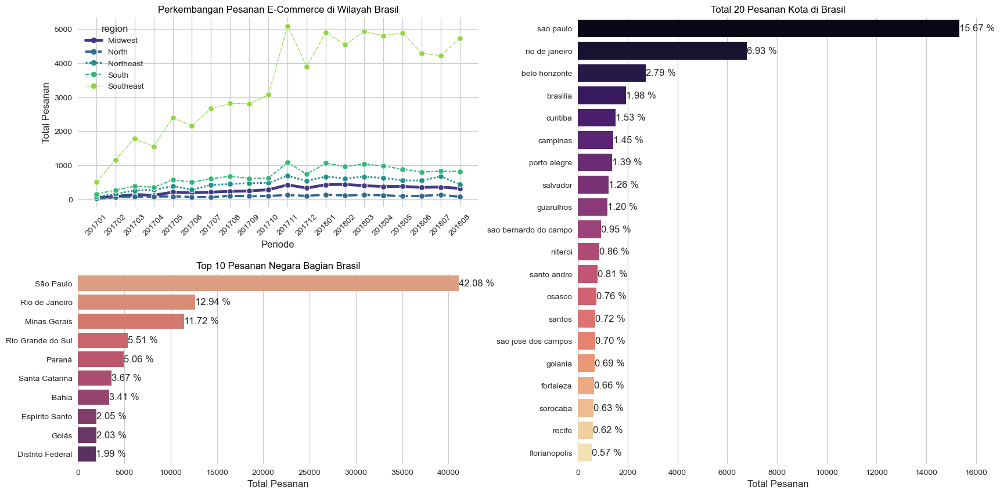

In [130]:
# Membuat dan menyiapkan gambar
fig = plt.figure(constrained_layout=True, figsize=(20, 10))
gs = GridSpec(2, 2, figure=fig, wspace=.25, hspace=.35)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[:, 1])

# Jumlah pesanan berdasarkan wilayah
sns.lineplot(
    data=df_regions_group,
    x='month',
    y='order_count',
    ax=ax1,
    hue='region',
    size='region',
    style='region',
    palette='viridis',
    markers=['o'] * 5
)

format_spines(ax1, right_border=False)
ax1.set_xlabel('Periode'), ax1.set_ylabel('Total Pesanan')
ax1.set_title(
    'Perkembangan Pesanan E-Commerce di Wilayah Brasil',
    size=12,
    color='black'
)

for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

plt.tight_layout()

# Kota-kota teratas dengan pesanan pelanggan terbanyak di Brasil
sns.barplot(
    data=df_states_group.head(10),
    x='order_id',
    y='customer_state',
    ax=ax2,
    palette='flare'
)

for i, val in enumerate(df_states_group.head(10)['order_id']):
    ax2.annotate(
        '{:.2f} %'.format(100*(val/sum(df_states_group['order_id']))),
        xy=(val, i),
        ha='left',
        va='center'
    )

format_spines(ax2, right_border=False)
ax2.set_xlabel('Total Pesanan'), ax2.set_ylabel('')
ax2.set_title(
    'Top 10 Pesanan Negara Bagian Brasil',
    size=12,
    color='black'
)

# Total pesanan berdasarkan negara bagian
sns.barplot(
    data=df_cities_group.head(20),
    x='order_id',
    y='customer_city',
    ax=ax3,
    palette='magma'
)

for i, val in enumerate(df_cities_group.head(20)['order_id']):
    ax3.annotate(
        '{:.2f} %'.format(100*(val/sum(df_cities_group['order_id']))),
        xy=(val, i),
        ha='left',
        va='center'
    )

format_spines(ax3, right_border=False)
ax3.set_title('Total 20 Pesanan Kota di Brasil', size=12, color='black')
ax3.set_xlabel('Total Pesanan'), ax3.set_ylabel('')
plt.savefig('perkembanganwilayah.png')
plt.show()



Dari plot Perkembangan Pesanan E-Commerce di Wilayah Brasil, dapat dilihat bahwa Brasil dibagi menjadi 5 wilayah utama, di mana wilayah Sudeste adalah wilayah dengan perkembangan pesanan e-commerce yang paling cepat dari Januari 2017 hingga Agustus 2018. Sementara itu, Sao Paulo dan Rio de Janeiro dari wilayah Sudeste juga menempati peringkat 1 dan 2 untuk pesanan teratas di setiap negara bagian dan kota.

In [76]:
# zip lokasi
latitude_list = list(eda_df['geolocation_lat'].values)
longitude_list = list(eda_df['geolocation_lng'].values)
locations = list(zip(latitude_list, longitude_list))

# Membuat peta menggunakan folium
map1 = folium.Map(location=[-15, -50], zoom_start=4.0)

# Plugin: FastMarkerCluster
FastMarkerCluster(data=locations).add_to(map1)

map1


In [77]:
# Mengelompokkan data geolokasi untuk membuat heatmap
heat_data = eda_df.groupby(
    ['geolocation_lat', 'geolocation_lng'],
    as_index=False
).count().iloc[:, :3]

# Membuat peta menggunakan folium
map1 = folium.Map(
    location=[-15, -50],
    zoom_start=4.0,
    tiles='cartodbdark_matter'
)

# Plugin: HeatMap
HeatMap(
    name='Heatmap',
    data=heat_data,
    radius=10,
    max_zoom=13
).add_to(map1)

map1


In [78]:
# Menampilkan Heatmap dengan Perubahan Waktu
epoch_list = []
time_index = eda_df['order_purchase_year_month'].sort_values().unique()

for epoch in time_index:
    data_temp = eda_df.query('order_purchase_year_month == @epoch')
    data_temp = data_temp.groupby(
        ['geolocation_lat', 'geolocation_lng'],
        as_index=False
    ).count()

    data_temp = data_temp.sort_values(
        'order_id', ascending=False
    ).iloc[:, :3]

    epoch_list.append(data_temp.values.tolist())

# Membuat peta menggunakan folium
map2 = folium.Map(
    location=[-15, -50],
    zoom_start=4.0,
    tiles='cartodbdark_matter'
)

# Plugin: HeatMapWithTime
HeatMapWithTime(
    name='Evolution of Orders in a Geolocation Perspective',
    data=epoch_list,
    radius=10,
    index=list(time_index)
).add_to(map2)

map2


Berdasarkan tiga peta di atas, dapat dilihat bahwa perkembangan pesanan e-commerce dari Januari 2017 hingga Agustus 2018 di Wilayah Tenggara Brasil berkembang sangat cepat. Hal ini menunjukkan bahwa, semakin banyak pelanggan yang beralih ke belanja online dari belanja konvensional. Dengan berbelanja online, pelanggan tidak perlu repot datang langsung ke toko dan harga yang mereka dapatkan cenderung lebih murah dibandingkan berbelanja langsung ke toko.

In [81]:
# Menampilkan data jumlah penjual (seller) berdasarkan negara bagian (seller_state) dan kode negara bagian
count_sellers_states = order_history.groupby('seller_state')[['seller_id']].nunique()\
    .sort_values('seller_id', ascending=False).reset_index()

# Membuat fungsi untuk mengonversi nama negara bagian menjadi kode negara bagian
def state_codes(cols):
    for key, val in state_dictionary.items():
        if val == cols[0]:
            return key

# Mengaplikasikan fungsi ke dalam DataFrame
count_sellers_states['state_code'] = count_sellers_states[['seller_state']].apply(state_codes, axis=1)
count_sellers_states.head()


,seller_state,seller_id,state_code
0,São Paulo,1844,SP
1,Paraná,347,PR
2,Minas Gerais,244,MG
3,Santa Catarina,190,SC
4,Rio de Janeiro,171,RJ


In [82]:
# Menampilkan data latitude dan longitude penjual berdasarkan negara bagian (seller_state), kota (seller_city), dan jumlah penjual unik (seller_id)
count_sellers_city = order_history.groupby(['seller_state', 'seller_city'])[['seller_id']].nunique()\
    .sort_values('seller_id', ascending=False).reset_index()

# Memilih satu kota teratas dari setiap negara bagian
top_sellers_city = count_sellers_city.groupby('seller_state').head(1)

# Membuat salinan data geolokasi untuk pengelompokan latitude dan longitude
seller_map = geo.drop('geolocation_zip_code_prefix', axis=1).copy().groupby('geolocation_city').mean()

# Membuat fungsi untuk pemetaan geolokasi
def geo_mapping(cols):
    try:
        return seller_map.loc[cols[0]]
    except:
        return np.nan

# Mengaplikasikan fungsi ke dalam DataFrame untuk menambahkan kolom latitude (seller_lat) dan longitude (seller_lng)
for i in [['geolocation_lat', 'seller_lat'], ['geolocation_lng', 'seller_lng']]:
    top_sellers_city[i[1]] = top_sellers_city[['seller_city']].apply(geo_mapping, axis=1)[i[0]]

# Menghapus baris yang memiliki nilai kosong
top_sellers_city.dropna(axis=0, inplace=True)
top_sellers_city.head()


,seller_state,seller_city,seller_id,seller_lat,seller_lng
0,São Paulo,sao paulo,692,-23.570860,-46.633242
1,Paraná,curitiba,123,-25.453054,-49.274996
2,Rio de Janeiro,rio de janeiro,93,-22.914910,-43.312883
3,Minas Gerais,belo horizonte,66,-19.908772,-43.957549
14,Distrito Federal,brasilia,28,-15.811073,-47.971705


In [120]:
#Input Brazilian Sellers' Map
map_brazil = folium.Map(
     location=[-14.235004,-51.92528],
     zoom_start=4.0,
     tiles="openstreetmap",
     control_scale=True
)

with open('Brasil.json', 'rb') as b:
    brazil_states = json.load(b)

for i in range(len(top_sellers_city)):
    rank = list(
        count_sellers_city[
            count_sellers_city['seller_city']==top_sellers_city.iloc[i].loc['seller_city']
        ].index.values
    ).pop()+1

    folium.Marker(
         [top_sellers_city.iloc[i]['seller_lat'],top_sellers_city.iloc[i]['seller_lng']],
         tooltip=(
              'Ranked #'+ str(rank)+', City: '+(top_sellers_city.iloc[i]['seller_city'].title())
              +' - '+(top_sellers_city.iloc[i]['seller_id']).astype('str')+' Sellers'
         ),
         icon=folium.Icon(color='blue'),
    ).add_to(map_brazil)

tiles_type = ['cartodbpositron', 'openstreetmap', 'stamenterrain']

for tile in tiles_type:
    folium.TileLayer(tile, attr='openstreetmap').add_to(map_brazil)

choropleth=folium.Choropleth(
     geo_data=brazil_states,
     data=count_sellers_states,
     columns=['state_code','seller_id'],
     key_on='feature.properties.UF',
     fill_color='Greys',
     nan_fill_color='White',
     legend_name='Top Sellers in Brazil',
     fill_opacity=1,
     line_opacity=1,
     smooth_factor=1,
     bins=100
).add_to(map_brazil)

state_json_index = []

for i in range(len(brazil_states['features'])):
    state_json_index.append(brazil_states['features'][i]['properties']['ESTADO'])

state_df = pd.DataFrame(data={
    'seller_state':state_json_index
})

state_df = state_df.merge(
    count_sellers_states.drop('state_code',axis=1),
    how='left',
    on='seller_state',
)

state_df.loc[state_df['seller_id'].isnull(),'seller_id'] = 0
state_df['seller_id'] = state_df['seller_id'].astype('int')
tooltip_text = []

for i in range(len(state_df)):
    tooltip_text.append(str(state_df['seller_id'][i])+' Sellers')

for idx in range(len(state_df)):
    brazil_states['features'][idx]['properties']['tooltip1'] = tooltip_text[idx]

style_function = "font-size: 14px; font-weight: bold"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
         fields=['UF','ESTADO','tooltip1'],
         aliases=['States Code: ','States Name: ','Total: '],
         style= style_function,
         labels= True
    ))

title= '''<h3 align="center" style="font-size:16px"><b>{}</b></h3>'''.format(
     "Top Sellers di Brazil sejak January 2017"
)

map_brazil.get_root().html.add_child(folium.Element(title))

map_brazil

Berdasarkan peta folium di atas, dapat dilihat bahwa titik koordinat penjual cenderung tersebar merata ke wilayah Tenggara Brasil.

In [91]:
# Menampilkan Nama dan Kode State Pelanggan beserta jumlah unique customer_unique_id
count_customers_states = order_history.groupby('customer_state')[['customer_unique_id']].nunique()\
    .sort_values('customer_unique_id', ascending=False).reset_index()

def state_codes(cols):
    for key, val in state_dictionary.items():
        if val == cols[0]:
            return key

count_customers_states['state_code'] = count_customers_states[['customer_state']].apply(state_codes, axis=1)
count_customers_states.head()


,customer_state,customer_unique_id,state_code
0,São Paulo,39869,SP
1,Rio de Janeiro,12253,RJ
2,Minas Gerais,11140,MG
3,Rio Grande do Sul,5226,RS
4,Paraná,4821,PR


In [92]:
# Menampilkan Latitude dan Longitude Pelanggan berdasarkan State, kota, dan jumlah unique customer_unique_id
count_customers_city = order_history.groupby(['customer_state', 'customer_city'])[['customer_unique_id']].nunique()\
    .sort_values('customer_unique_id', ascending=False).reset_index()

top_customers_city = count_customers_city.groupby('customer_state').head(1)
customer_map = geo.drop('geolocation_zip_code_prefix', axis=1).copy().groupby('geolocation_city').mean()

def geo_mapping(cols):
    try:
        return customer_map.loc[cols[0]]
    except:
        return np.nan

for i in [['geolocation_lat', 'customer_lat'], ['geolocation_lng', 'customer_lng']]:
    top_customers_city[i[1]] = top_customers_city[['customer_city']].apply(geo_mapping, axis=1)[i[0]]

top_customers_city.dropna(axis=0, inplace=True)
top_customers_city.head()


,customer_state,customer_city,customer_unique_id,customer_lat,customer_lng
0,São Paulo,sao paulo,14821,-23.570860,-46.633242
1,Rio de Janeiro,rio de janeiro,6551,-22.914910,-43.312883
2,Minas Gerais,belo horizonte,2645,-19.908772,-43.957549
3,Distrito Federal,brasilia,2051,-15.811073,-47.971705
4,Paraná,curitiba,1450,-25.453054,-49.274996


In [94]:
# Input Peta Pelanggan Brasil
map_brazil = folium.Map(
     location=[-14.235004,-51.92528],
     zoom_start=4.0,
     tiles="openstreetmap",
     control_scale=True
)

# Membuka file JSON untuk mendapatkan data batas wilayah negara bagian Brasil
with open('Brasil.json', 'rb') as b:
    brazil_states = json.load(b)

# Menambahkan marker untuk setiap kota pelanggan
for i in range(len(top_customers_city)):
    # Menentukan peringkat kota berdasarkan jumlah pelanggan unik
    rank = list(
        count_customers_city[
            count_customers_city['customer_city'] == top_customers_city.iloc[i].loc['customer_city']
        ].index.values
    ).pop() + 1

    # Menambahkan marker ke peta
    folium.Marker(
         [top_customers_city.iloc[i]['customer_lat'], top_customers_city.iloc[i]['customer_lng']],
         tooltip=(
              'Peringkat #' + str(rank) + ', Kota: ' + (top_customers_city.iloc[i]['customer_city'].title())
              + ' - ' + (top_customers_city.iloc[i]['customer_unique_id']).astype('str') + ' Pelanggan'
         ),
         icon=folium.Icon(color='blue'),
    ).add_to(map_brazil)

# Menambahkan lapisan peta dengan tipe tegel yang berbeda
tiles_type = ['cartodbpositron', 'openstreetmap', 'stamenterrain']
for tile in tiles_type:
    folium.TileLayer(tile,attr='openstreetmap').add_to(map_brazil)

# Menambahkan choropleth layer untuk menampilkan informasi jumlah pelanggan di setiap negara bagian Brasil
choropleth = folium.Choropleth(
     geo_data=brazil_states,
     data=count_customers_states,
     columns=['state_code', 'customer_unique_id'],
     key_on='feature.properties.UF',
     fill_color='Greys',
     nan_fill_color='White',
     legend_name='Top Sellers in Brazil',
     fill_opacity=1,
     line_opacity=1,
     smooth_factor=1,
     bins=100
).add_to(map_brazil)

# Menambahkan informasi tooltip untuk setiap negara bagian
state_json_index = []

for i in range(len(brazil_states['features'])):
    state_json_index.append(brazil_states['features'][i]['properties']['ESTADO'])

state_df = pd.DataFrame(data={
    'customer_state': state_json_index
})

state_df = state_df.merge(
    count_customers_states.drop('state_code', axis=1),
    how='left',
    on='customer_state',
)

state_df.loc[state_df['customer_unique_id'].isnull(), 'customer_unique_id'] = 0
state_df['customer_unique_id'] = state_df['customer_unique_id'].astype('int')
tooltip_text = []

for i in range(len(state_df)):
    tooltip_text.append(str(state_df['customer_unique_id'][i]) + ' Pelanggan')

for idx in range(len(state_df)):
    brazil_states['features'][idx]['properties']['tooltip1'] = tooltip_text[idx]

style_function = "font-size: 14px; font-weight: bold"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
         fields=['UF', 'ESTADO', 'tooltip1'],
         aliases=['Kode Negara Bagian: ', 'Nama Negara Bagian: ', 'Total: '],
         style=style_function,
         labels=True
    )
)

# Menambahkan judul ke peta
title = '''<h3 align="center" style="font-size:16px"><b>{}</b></h3>'''.format(
     "Total Pelanggan di Brasil berdasarkan Negara Bagian sejak Januari 2017"
)

map_brazil.get_root().html.add_child(folium.Element(title))

# Menampilkan peta
map_brazil


In [ ]:
Berdasarkan peta folium di atas, dapat dilihat bahwa titik koordinat pelanggan cenderung tersebar merata di seluruh Wilayah Brasil.


In [95]:
# Menghitung harga per pesanan dan ongkos kirim per pesanan
harga_dict = order_history.groupby('order_id')['price'].sum().to_dict()
ongkos_kirim_dict = order_history.groupby('order_id')['freight_value'].sum().to_dict()

def jumlah_harga(cols):
    return harga_dict.setdefault(cols[0])

def jumlah_ongkos_kirim(cols):
    return ongkos_kirim_dict.setdefault(cols[0])

eda_df['harga'] = eda_df[['order_id']].apply(jumlah_harga, axis=1)
eda_df['ongkos_kirim'] = eda_df[['order_id']].apply(jumlah_ongkos_kirim, axis=1)

# Total Pesanan per Bulan
jumlah_pesanan_bulan = pd.DataFrame(
    eda_df.groupby('order_purchase_year_month'
)['order_id'].count())

# Mengelompokkan data
df_agregat_bulan = eda_df.groupby(
    ['order_purchase_year', 'order_purchase_year_month'],
    as_index=False
).agg({
    'order_id': 'count',
    'harga': 'sum',
    'ongkos_kirim': 'sum'
})

# Menambahkan kolom baru untuk analisis
df_agregat_bulan['harga_per_pesanan'] = df_agregat_bulan['harga'] / df_agregat_bulan['order_id']
df_agregat_bulan['ongkos_kirim_per_pesanan'] = df_agregat_bulan['ongkos_kirim'] / df_agregat_bulan['order_id']
df_agregat_bulan.head()


,order_purchase_year,order_purchase_year_month,order_id,harga,ongkos_kirim,harga_per_pesanan,ongkos_kirim_per_pesanan
0,2017,201701,784,118198.10,16794.88,150.762883,21.422041
1,2017,201702,1715,245342.89,38595.32,143.057079,22.504560
2,2017,201703,2627,373235.21,57370.02,142.076593,21.838607
3,2017,201704,2376,358796.02,52196.13,151.008426,21.968068
4,2017,201705,3646,503178.55,79769.66,138.008379,21.878678


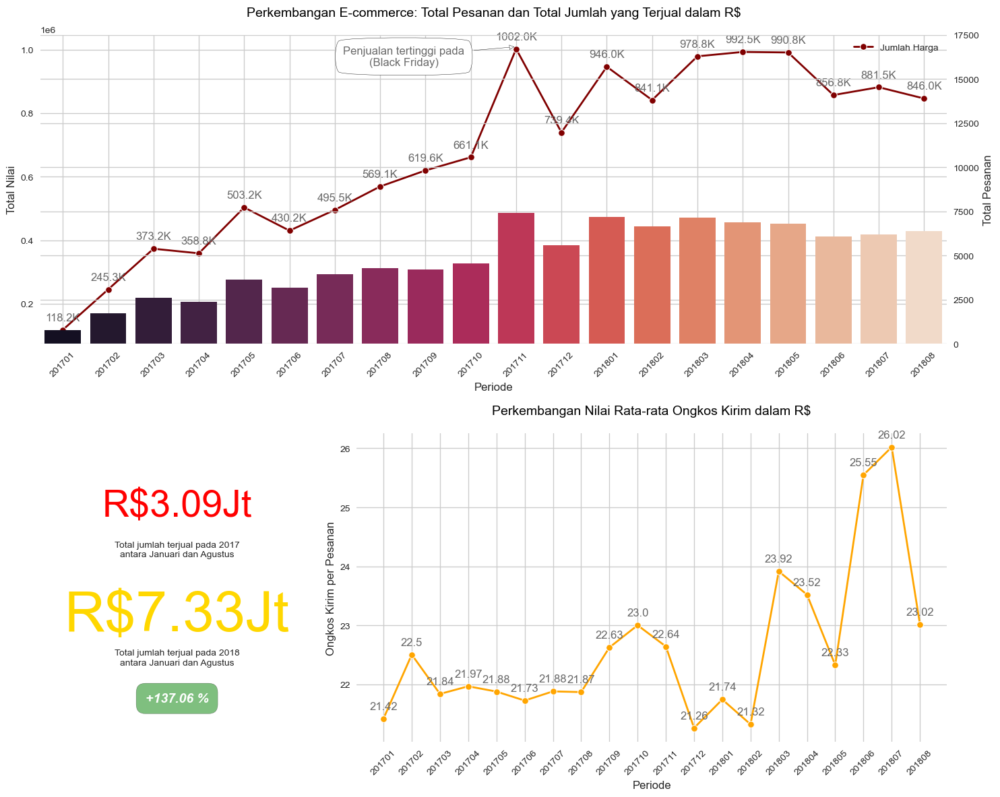

In [126]:
# Membuat gambar
fig = plt.figure(constrained_layout=True, figsize=(15, 12))

# Mendefinisikan sumbu
gs = GridSpec(2, 3, figure=fig)
ax1 = fig.add_subplot(gs[0, :])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1:])

# Plot 1 - Perkembangan total pesanan dan total penjualan di e-commerce
sns.lineplot(
    data=df_agregat_bulan,
    x='order_purchase_year_month',
    y='harga',
    ax=ax1,
    linewidth=2,
    color='maroon',
    marker='o',
    label='Jumlah Harga'
)

ax1.set_xlabel('Periode')
ax1.set_ylabel('Total Nilai')
ax1_twx = ax1.twinx()
sns.barplot(
    jumlah_pesanan_bulan,
    x=jumlah_pesanan_bulan.index,
    y=jumlah_pesanan_bulan['order_id'],
    ax=ax1_twx,
    palette='rocket'
)

ax1_twx.set_ylabel('Total Pesanan')
ax1_twx.set_yticks(np.arange(0, 20000, 2500))
format_spines(ax1, right_border=False)
format_spines(ax1_twx, right_border=False)

# Menyesuaikan plot pertama
for tick in ax1.get_xticklabels():
    tick.set_rotation(45)

for x, y in df_agregat_bulan.harga.items():
    ax1.annotate(
        str(round(y / 1000, 1)) + 'K',
        xy=(x, y),
        xytext=(0, 10),
        textcoords='offset points',
        ha='center',
        color='dimgrey'
    )

ax1.annotate(
    f'Penjualan tertinggi pada\n(Black Friday)',
    xy=(10, 1009000),
    xytext=(-120, -20),
    textcoords='offset points',
    bbox=dict(boxstyle="round4", fc="w", pad=.8),
    arrowprops=dict(arrowstyle='-|>', fc='w'),
    color='dimgrey',
    ha='center'
)

ax1.set_title(
    'Perkembangan E-commerce: Total Pesanan dan Total Jumlah yang Terjual dalam R$',
    size=14,
    color='black',
    pad=20
)

# Plot 2 - Perbandingan Besar Penjualan
perbandingan_bulan = sorted(df_orders_compare['order_purchase_year_month'].unique())
df_penjualan_banding = df_agregat_bulan.query('order_purchase_year_month in (@perbandingan_bulan)')
terjual_2017 = df_penjualan_banding.query('order_purchase_year == 2017')['harga'].sum()
terjual_2018 = df_penjualan_banding.query('order_purchase_year == 2018')['harga'].sum()
pertumbuhan = (terjual_2018 - terjual_2017) / terjual_2017
ax2.axis('off')
ax2.text(
    x=0.50,
    y=0.73,
    s='R$' + str(round(terjual_2017 / 1000000, 2)) + 'Jt',
    fontsize=40,
    color='red',
    ha='center'
)

ax2.text(
    x=0.50,
    y=0.60,
    s='Total jumlah terjual pada 2017\nantara Januari dan Agustus',
    fontsize=10,
    ha='center'
)

ax2.text(
    x=0.50,
    y=0.36,
    s='R$' + str(round(terjual_2018 / 1000000, 2)) + 'Jt',
    fontsize=60,
    color='gold',
    ha='center'
)

ax2.text(
    x=0.50,
    y=0.25,
    s='Total jumlah terjual pada 2018\nantara Januari dan Agustus',
    fontsize=10,
    ha='center'
)

signal = '+' if pertumbuhan > 0 else '-'
ax2.text(
    x=0.50,
    y=0.13,
    s=f'{signal}{str(round(100 * pertumbuhan, 2))} %',
    fontsize=14,
    ha='center',
    color='white',
    style='italic',
    weight='bold',
    bbox=dict(
        facecolor='green',
        alpha=0.5,
        pad=10,
        boxstyle='round, pad=.7'
    )
)

# Plot 3 - Perkembangan nilai rata-rata ongkos kirim yang dibayar oleh pelanggan
sns.lineplot(
    data=df_agregat_bulan,
    x='order_purchase_year_month',
    y='ongkos_kirim_per_pesanan',
    linewidth=2,
    color='orange',
    marker='o',
    ax=ax3
)

format_spines(ax3, right_border=False)

for tick in ax3.get_xticklabels():
    tick.set_rotation(45)

for x, y in df_agregat_bulan.ongkos_kirim_per_pesanan.items():
    ax3.annotate(
        round(y, 2),
        xy=(x, y),
        textcoords='offset points',
        xytext=(0, 10),
        ha='center',
        color='dimgrey'
    )

ax3.set_xlabel('Periode')
ax3.set_ylabel('Ongkos Kirim per Pesanan')
ax3.set_title(
    'Perkembangan Nilai Rata-rata Ongkos Kirim dalam R$',
    size=14,
    color='black',
    pad=20
)

plt.tight_layout()
plt.savefig('totalcuy.png')
plt.show()



Penjualan tertinggi dalam sejarah terjadi pada November 2017. Kemungkinan besar ini terjadi saat acara Black Friday, di mana setiap toko mungkin memberikan diskon besar-besaran yang hanya terjadi selama 1 hari. Nilainya adalah 1002K hanya untuk 1 bulan.

Jumlah total antara Januari dan Agustus 2017 hingga Januari dan Agustus 2018 juga meningkat sebesar 137.04%. Sementara Perkembangan Nilai Rata-rata Ongkos Kirim cenderung stabil dari Januari 2017 hingga Mei 2018. Peningkatan tajam terjadi pada Juli 2018. Ini mungkin terjadi karena banyak pelanggan baru yang menggunakan Olist sebagai e-commerce harian mereka untuk berbelanja.


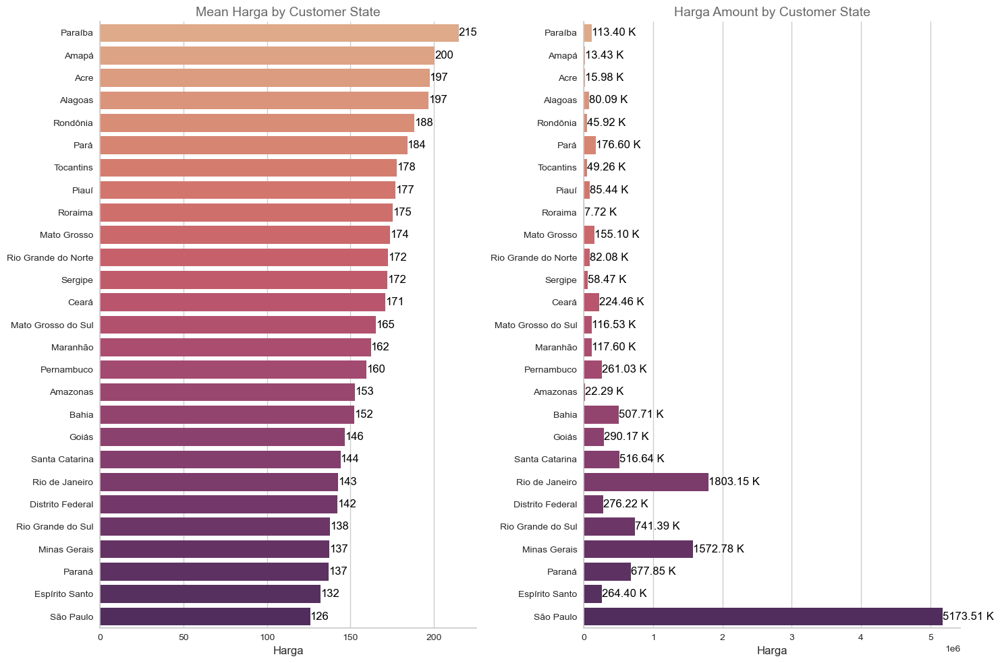

In [100]:
# Menampilkan analisis rata-rata dan total harga berdasarkan negara pelanggan
mean_sum_analysis(
    eda_df,
    group_col='customer_state',
    value_col='harga',
    palette='flare',
    figsize=(15, 10),
)


Terlihat dari kedua plot di atas, dapat dilihat bahwa rata-rata harga terbesar berdasarkan negara bagian pelanggan adalah Paraiba dengan R$215, tetapi jumlah harga cenderung rendah dengan hanya R$113.40K. Sebaliknya, proporsional terbalik dengan Sao Paulo di mana harga rata-ratanya terendah, tetapi memiliki jumlah harga terbesar dibandingkan dengan negara bagian lainnya, yaitu R$5172.26K. Hal ini menunjukkan bahwa aktivitas transaksi online pembelian dan penjualan terbanyak terjadi di negara bagian ini.

In [104]:
# Membuat DataFrame untuk Data Pemesanan
order_date_df = order_history.groupby('order_id')[
    'order_id',
    'order_purchase_timestamp',
    'order_delivered_customer_date',
    'order_estimated_delivery_date',
    'customer_state'
].head(1)

order_date_df['freight_value'] = order_date_df[['order_id']].apply(jumlah_ongkos_kirim, axis=1)
order_date_df.drop(
    index=order_date_df[order_date_df['order_delivered_customer_date'].isnull()].index,
    inplace=True
)

# Menghitung jumlah hari kerja antara pembelian, pengiriman, dan perkiraan pengiriman
purchasing = order_date_df['order_purchase_timestamp']
delivered = order_date_df['order_delivered_customer_date']
estimated = order_date_df['order_estimated_delivery_date']
order_date_df['time_to_delivery'] = calc_working_days(purchasing, delivered, convert=True)
order_date_df['diff_estimated_delivery'] = calc_working_days(estimated, delivered, convert=True)

# Mengelompokkan data berdasarkan negara bagian
states_avg_grouped = order_date_df.groupby(
    'customer_state',
    as_index=False
).mean()

states_freight_paid = states_avg_grouped.loc[:, ['customer_state', 'freight_value']]
states_time_to_delivery = states_avg_grouped.loc[:, ['customer_state', 'time_to_delivery']]
states_estimated_delivery = states_avg_grouped.loc[:, ['customer_state', 'diff_estimated_delivery']]

# Mengurutkan data
states_freight_paid = states_freight_paid.sort_values('freight_value', ascending=False)
states_time_to_delivery = states_time_to_delivery.sort_values('time_to_delivery', ascending=False)
states_estimated_delivery = states_estimated_delivery.sort_values('diff_estimated_delivery')


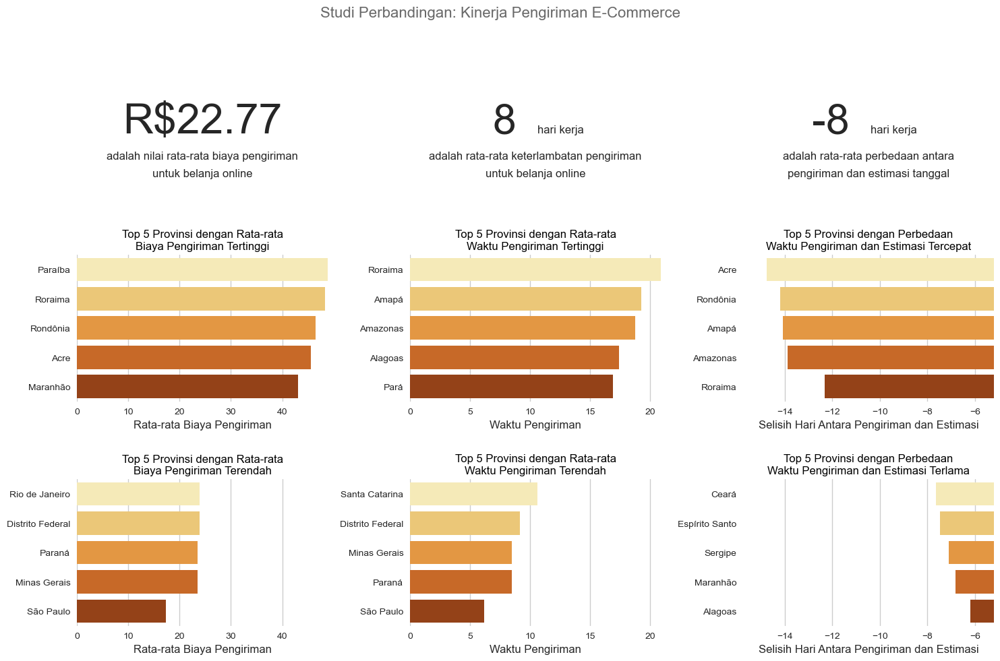

In [127]:
# Import library yang diperlukan
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns

# Fungsi untuk memformat spines plot
def format_spines(ax, right_border=True):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(right_border)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

# Plot E-Commerce Delivery Performance
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

# Plot 01 - Freight value paid on states
sns.barplot(
    data=states_freight_paid.head(),
    x='freight_value',
    y='customer_state',
    ax=axs[1, 0],
    palette='YlOrBr'
)

axs[1, 0].set_title(
    'Top 5 Provinsi dengan Rata-rata\nBiaya Pengiriman Tertinggi',
    size=12,
    color='black'
)

sns.barplot(
    data=states_freight_paid.tail(),
    x='freight_value',
    y='customer_state',
    ax=axs[2, 0],
    palette='YlOrBr'
)

axs[2, 0].set_title(
    '\nTop 5 Provinsi dengan Rata-rata\nBiaya Pengiriman Terendah',
    size=12,
    color='black'
)

for ax in axs[1, 0], axs[2, 0]:
    ax.set_xlabel('Rata-rata Biaya Pengiriman')
    ax.set_xlim(0, states_freight_paid['freight_value'].max())
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0, 0].text(
    x=0.50,
    y=0.30,
    s=f'R${round(order_date_df.freight_value.mean(), 2)}',
    fontsize=45,
    ha='center'
)

axs[0, 0].text(
    x=0.50,
    y=0.12,
    s='adalah nilai rata-rata biaya pengiriman',
    fontsize=12,
    ha='center'
)

axs[0, 0].text(
    x=0.50, y=0.00,
    s='untuk belanja online',
    fontsize=12,
    ha='center'
)

axs[0, 0].axis('off')

# Plot 02 - Time to delivery on states
sns.barplot(
    data=states_time_to_delivery.head(),
    x='time_to_delivery',
    y='customer_state',
    ax=axs[1, 1],
    palette='YlOrBr'
)

axs[1, 1].set_title(
    'Top 5 Provinsi dengan Rata-rata\nWaktu Pengiriman Tertinggi',
    size=12,
    color='black'
)

sns.barplot(
    data=states_time_to_delivery.tail(),
    x='time_to_delivery',
    y='customer_state',
    ax=axs[2, 1],
    palette='YlOrBr'
)

axs[2, 1].set_title(
    '\nTop 5 Provinsi dengan Rata-rata\nWaktu Pengiriman Terendah',
    size=12,
    color='black'
)

for ax in axs[1, 1], axs[2, 1]:
    ax.set_xlabel('Waktu Pengiriman')
    ax.set_xlim(0, states_time_to_delivery['time_to_delivery'].max())
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0, 1].text(
    x=0.375,
    y=0.30,
    s=f'{int(order_date_df.time_to_delivery.mean())}',
    fontsize=45,
    ha='center'
)

axs[0, 1].text(
    x=0.60,
    y=0.30,
    s='hari kerja',
    fontsize=12,
    ha='center'
)

axs[0, 1].text(
    x=0.50,
    y=0.12,
    s='adalah rata-rata keterlambatan pengiriman',
    fontsize=12,
    ha='center'
)

axs[0, 1].text(
    x=0.50,
    y=0.00,
    s='untuk belanja online',
    fontsize=12,
    ha='center'
)

axs[0, 1].axis('off')

# Plot 03 - Difference between delivered and estimated on states
sns.barplot(
    data=states_estimated_delivery.head(),
    x='diff_estimated_delivery',
    y='customer_state',
    ax=axs[1, 2],
    palette='YlOrBr'
)

axs[1, 2].set_title(
    'Top 5 Provinsi dengan Perbedaan\nWaktu Pengiriman dan Estimasi Tercepat',
    size=12,
    color='black'
)

sns.barplot(
    data=states_estimated_delivery.tail(),
    x='diff_estimated_delivery',
    y='customer_state',
    ax=axs[2, 2],
    palette='YlOrBr'
)
axs[2, 2].set_title(
    '\nTop 5 Provinsi dengan Perbedaan\nWaktu Pengiriman dan Estimasi Terlama',
    size=12,
    color='black'
)

for ax in axs[1, 2], axs[2, 2]:
    ax.set_xlabel('Selisih Hari Antara Pengiriman dan Estimasi')
    ax.set_xlim(states_estimated_delivery['diff_estimated_delivery'].min() - 1,
                states_estimated_delivery['diff_estimated_delivery'].max() + 1)
    format_spines(ax, right_border=False)
    ax.set_ylabel('')

# Annotations
axs[0, 2].text(
    x=0.35,
    y=0.30,
    s=f'{int(order_date_df.diff_estimated_delivery.mean())}',
    fontsize=45,
    ha='center'
)

axs[0, 2].text(
    x=0.60,
    y=0.30,
    s='hari kerja',
    fontsize=12,
    ha='center'
)

axs[0, 2].text(
    x=0.50,
    y=0.12,
    s='adalah rata-rata perbedaan antara',
    fontsize=12,
    ha='center'
)

axs[0, 2].text(
    x=0.50,
    y=0.00,
    s='pengiriman dan estimasi tanggal',
    fontsize=12,
    ha='center'
)

axs[0, 2].axis('off')

plt.suptitle(
    'Studi Perbandingan: Kinerja Pengiriman E-Commerce',
    size=16,
    color='dimgrey'
)
plt.tight_layout()
plt.savefig('kinerjapengiriman.png')
plt.show()



- Nilai rata-rata biaya pengiriman adalah R$22,77. Namun, masih banyak provinsi yang harus membayar lebih dari R$40 untuk biaya pengiriman. Lima teratas adalah Paraiba, Roraima, Rondonia, Acre, dan Maranhao.
- Meskipun Provinsi Roraima juga berada di posisi kedua dari lima provinsi dengan waktu pengiriman rata-rata tertinggi, hal ini perlu didiskusikan lebih lanjut oleh tim Olist. Sehingga, nilai biaya pengiriman dapat disesuaikan dan setiap pelanggan mendapatkan layanan pengiriman terbaik dengan harga yang tepat.

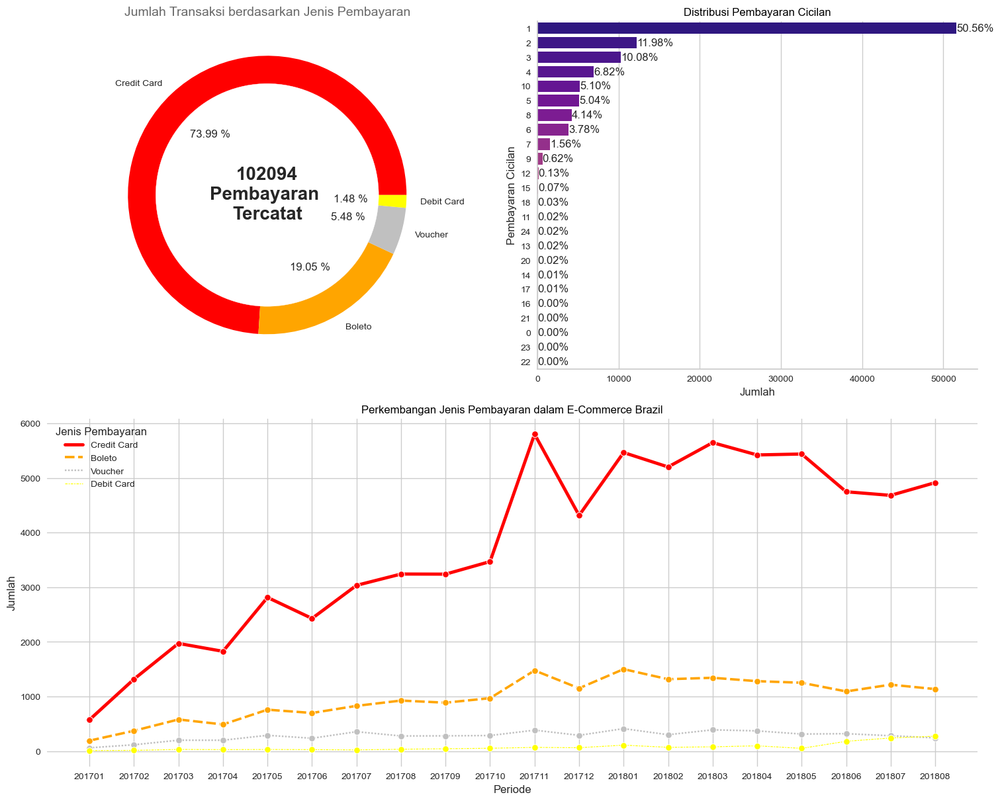

In [129]:
# Mengelompokkan data
def edit_payment_type(cols):
    return ' '.join(cols.split('_')).title()

df_orders_pay = eda_df.merge(customer_payments, how='left', on='order_id')
df_orders_pay['payment_type'] = df_orders_pay['payment_type'].apply(edit_payment_type)
df_orders_pay['payment_installments'] = df_orders_pay['payment_installments'].astype(int)
df_orders_pay.rename(columns={'payment_type':'Jenis Pembayaran'}, inplace=True)

# Membuat gambar
fig = plt.figure(constrained_layout=True, figsize=(15, 12))

# Definisi sumbu
gs = GridSpec(2, 2, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

# Plot 1 - Jenis pembayaran dalam diagram donat
colors = ['red', 'orange', 'silver', 'yellow', 'grey']
label_names = df_orders_pay['Jenis Pembayaran'].value_counts().index
donut_plot(
    df_orders_pay,
    col='Jenis Pembayaran',
    ax=ax1,
    label_names=label_names,
    colors=colors,
    title='Jumlah Transaksi berdasarkan Jenis Pembayaran',
    text=f'{len(df_orders_pay)}\nPembayaran \nTercatat'
)

# Plot 2 - Pembayaran cicilan
single_countplot(
    df_orders_pay,
    y='payment_installments',
    ax=ax2
)

ax2.set_xlabel('Jumlah'), ax2.set_ylabel('Pembayaran Cicilan')
ax2.set_title(
    'Distribusi Pembayaran Cicilan',
    color='black',
    size=12
)

# Plot 3 - Perkembangan jenis pembayaran
payment_evl = df_orders_pay.groupby(
    ['order_purchase_year_month','Jenis Pembayaran'],
    as_index=False
).count()

payment_evl = payment_evl.loc[:,['order_purchase_year_month','Jenis Pembayaran','order_id']]
payment_evl = payment_evl.sort_values(
    ['order_purchase_year_month','order_id'],
    ascending=[True, False]
)

sns.lineplot(
    data=payment_evl,
    x='order_purchase_year_month',
    y='order_id',
    ax=ax3, hue='Jenis Pembayaran',
    style='Jenis Pembayaran',
    size='Jenis Pembayaran',
    palette=colors,
    marker='o'
)

format_spines(ax3, right_border=False)
ax3.set_xlabel('Periode'), ax3.set_ylabel('Jumlah')
ax3.set_title(
    'Perkembangan Jenis Pembayaran dalam E-Commerce Brazil',
    size=12,
    color='black'
)
plt.savefig('jumlahtransaksi.png')
plt.show()


- Berdasarkan ketiga grafik di atas, terlihat bahwa kartu kredit adalah pilihan pembayaran yang paling disukai oleh pelanggan, mencapai 73.99% dari total. Perkembangan jenis pembayaran dengan kartu kredit juga meningkat pesat dari Januari 2017 hingga Mei 2018. Banyak pelanggan juga lebih memilih untuk membayar dengan cicilan selama 1 bulan. Hal ini menunjukkan bahwa dengan pembayaran menggunakan kartu kredit, pelanggan tidak perlu membayar sekaligus untuk produk yang mereka beli. Mereka dapat membayarnya dengan cicilan sesuai yang mereka inginkan dan dapat dilakukan pada akhir periode.
- Pembayaran cicilan terbanyak yang dipilih oleh pelanggan adalah 1. Ini menunjukkan bahwa banyak pelanggan membeli produk yang tidak terlalu mahal dan masih dapat dibayar pada akhir bulan pertama.

In [107]:
# Menggabungkan Nilai Pembayaran dari Pembayaran Pesanan
print('\n'+(' DataFrame Pembayaran Pesanan ').center(151,'-'))
display(order_payments.head())
print('\n'+(' Mengelompokkan Berdasarkan Order_ID sebagai : aggregated_df').center(151,'-'))
aggregated_df = order_payments.groupby('order_id')['payment_value'].sum().reset_index()
display(aggregated_df.head())



------------------------------------------------------------- DataFrame Pembayaran Pesanan ------------------------------------------------------------


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45



---------------------------------------------- Mengelompokkan Berdasarkan Order_ID sebagai : aggregated_df---------------------------------------------


,order_id,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,72.19
1,00018f77f2f0320c557190d7a144bdd3,259.83
2,000229ec398224ef6ca0657da4fc703e,216.87
3,00024acbcdf0a6daa1e931b038114c75,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,218.04


In [108]:
# Menggabungkan DataFrame Pesanan dan Pelanggan berdasarkan customer_id
print('\n'+(' DataFrame Pesanan ').center(151,'-'))
display(orders.head())
print('\n'+(' DataFrame Pelanggan ').center(151,'-'))
display(customer.head())
print('\n'+(' Left Join pada order_id sebagai : rfm_table ').center(151,'-'))
rfm_table = pd.merge(orders, customer, on='customer_id', how='left')
display(rfm_table.head())



------------------------------------------------------------------ DataFrame Pesanan ------------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00



----------------------------------------------------------------- DataFrame Pelanggan -----------------------------------------------------------------


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP



----------------------------------------------------- Left Join pada order_id sebagai : rfm_table -----------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP


In [109]:
# Menggabungkan rfm_table dan aggregated_df ke dalam DataFrame rfm_table berdasarkan order_id
print('\n'+(' rfm_table ').center(151,'-'))
display(rfm_table.head())
print('\n'+(' aggregated_df ').center(151,'-'))
display(aggregated_df.head())
print('\n'+(' Gabung sebagai : rfm_table ').center(151,'-'))
rfm_table = pd.merge(rfm_table, aggregated_df, on='order_id', how='left')
display(rfm_table.head())



---------------------------------------------------------------------- rfm_table ----------------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP



-------------------------------------------------------------------- aggregated_df --------------------------------------------------------------------


,order_id,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,72.19
1,00018f77f2f0320c557190d7a144bdd3,259.83
2,000229ec398224ef6ca0657da4fc703e,216.87
3,00024acbcdf0a6daa1e931b038114c75,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,218.04



-------------------------------------------------------------- Gabung sebagai : rfm_table -------------------------------------------------------------


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,sao paulo,SP,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,af07308b275d755c9edb36a90c618231,47813,barreiras,BA,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,3a653a41f6f9fc3d2a113cf8398680e8,75265,vianopolis,GO,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,7c142cf63193a1473d2e66489a9ae977,59296,sao goncalo do amarante,RN,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,72632f0f9dd73dfee390c9b22eb56dd6,9195,santo andre,SP,28.62


> **Analisis RFM** <br>

Analisis RFM adalah teknik segmentasi perilaku pelanggan berbasis data. RFM singkatan dari recency, frequency, dan monetary value. Ide dasarnya adalah membagi pelanggan berdasarkan kapan pembelian terakhir mereka, seberapa sering mereka telah membeli sebelumnya, dan berapa banyak mereka telah menghabiskan secara keseluruhan. Ketiga ukuran ini terbukti menjadi prediktor yang efektif terhadap kemauan pelanggan untuk terlibat dalam pesan pemasaran dan penawaran.


Kolom penting untuk analisis RFM:
1. **R**ecency - `order_purchase_timestamp`
2. **F**requency - `customer_unique_id`
3. **M**onetery - `payment_value`


In [110]:
# Menampilkan Kolom Penting untuk Analisis RFM dari rfm_table
print('\n' + (' Penting ').center(151, '-'))
rfm_table = rfm_table[['order_purchase_timestamp', 'customer_unique_id', 'payment_value']]
display(rfm_table.head())



----------------------------------------------------------------------- Penting -----------------------------------------------------------------------


,order_purchase_timestamp,customer_unique_id,payment_value
0,2017-10-02 10:56:33,7c396fd4830fd04220f754e42b4e5bff,38.71
1,2018-07-24 20:41:37,af07308b275d755c9edb36a90c618231,141.46
2,2018-08-08 08:38:49,3a653a41f6f9fc3d2a113cf8398680e8,179.12
3,2017-11-18 19:28:06,7c142cf63193a1473d2e66489a9ae977,72.20
4,2018-02-13 21:18:39,72632f0f9dd73dfee390c9b22eb56dd6,28.62


In [111]:
# Mengubah format data order_purchase_timestamp menjadi datetime
rfm_table['order_purchase_timestamp'] = pd.to_datetime(rfm_table['order_purchase_timestamp'])

# Membuat final_rfm_table
final_rfm_table = rfm_table.groupby('customer_unique_id').agg({
    'order_purchase_timestamp': 'max',  # Mengambil nilai maksimum dari order_purchase_timestamp untuk Recency
    'payment_value': 'sum',  # Menghitung total nilai pembayaran per pelanggan untuk Monetary
    'customer_unique_id': 'count'  # Menghitung total pelanggan yang berbeda untuk Frequency
}).rename(columns={'customer_unique_id': 'frequency', 'payment_value': 'monetary'}).reset_index()

# Menggabungkan nilai recency agar menjadi integer alih-alih datetime
final_rfm_table['recency'] = (rfm_table['order_purchase_timestamp'].max() - final_rfm_table['order_purchase_timestamp']).dt.days
final_rfm_table.drop('order_purchase_timestamp', axis=1, inplace=True)
print('\n' + (' Final RFM Table ').center(151, '-'))
display(final_rfm_table.head())



------------------------------------------------------------------- Final RFM Table -------------------------------------------------------------------


,customer_unique_id,monetary,frequency,recency
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163
2,0000f46a3911fa3c0805444483337064,86.22,1,585
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336



================================================================ Descriptive Statistics ===============================================================


,count,mean,std,min,25%,50%,75%,max
monetary,96096.0,166.592492,231.428332,0.0,63.12,108.0,183.53,13664.08
frequency,96096.0,1.034809,0.214384,1.0,1.00,1.0,1.00,17.00
recency,96096.0,287.735691,153.414676,0.0,163.00,268.0,397.00,772.00



==================================================================== Normality Test ===================================================================


,Statistic,P-Value,Normally Distributed
monetary,0.259657,< 0.05,False
frequency,0.534122,< 0.05,False
recency,0.060429,< 0.05,False



=============================================================== Distribution & Outliers ===============================================================


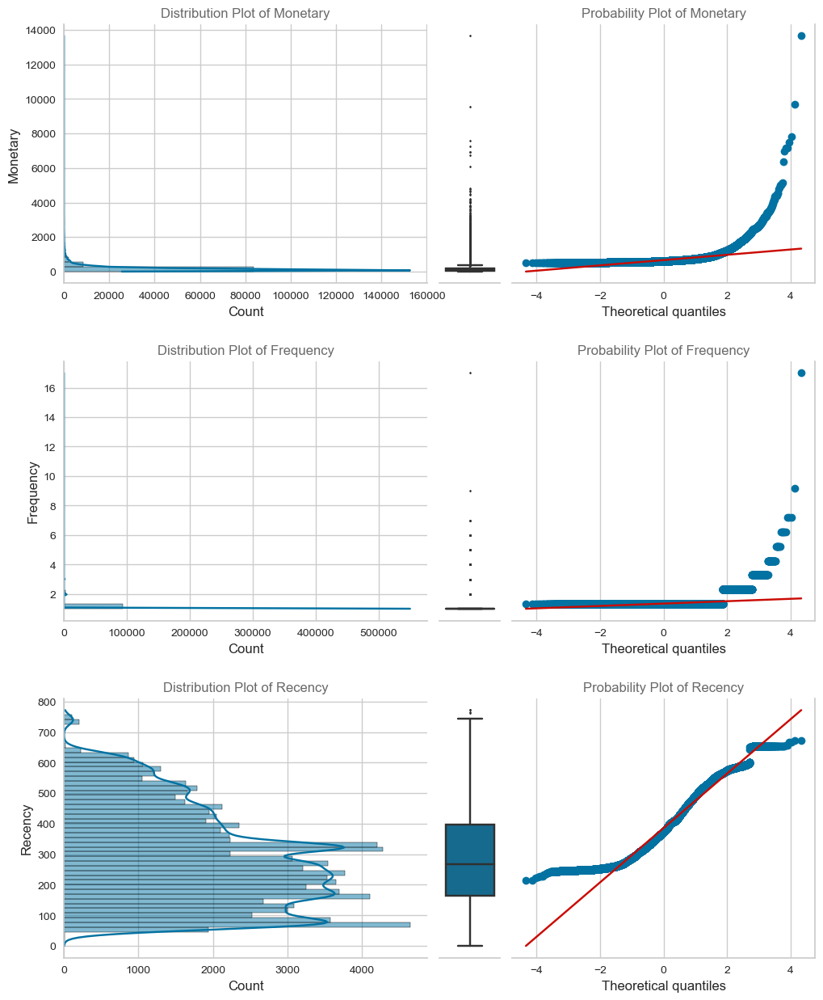

In [112]:
# Menampilkan Statistik Deskriptif, Uji Normalitas, Distribusi & Plot Outliers dari final_rfm_table
print('\n'+(' Descriptive Statistics ').center(151,'='))
display(final_rfm_table.describe().T)

print('\n'+' Normality Test '.center(151,'='))
cols, stats_val, p_val, result = [], [], [], []

for i in final_rfm_table.describe().columns:
    stat, pvalue = stats.kstest(
        final_rfm_table[i],
        np.random.normal(
            final_rfm_table[i].mean(),
            final_rfm_table[i].std(),
            size=len(final_rfm_table[i])
        )
    )

    cols.append(i)
    stats_val.append(stat)
    p_val.append('> 0.05' if pvalue > 0.05 else '< 0.05')
    result.append(True if pvalue > 0.05 else False)

display(pd.DataFrame(
    data={
        'Statistic':stats_val,
        'P-Value':p_val,
        'Normally Distributed':result
    },
    index=cols
))

print('\n'+(' Distribution & Outliers ').center(151,'='))
fig, axes = plt.subplots(
    nrows=3,
    ncols=3,
    figsize=(12, 15),
    gridspec_kw={
        'width_ratios':[6,1,5],
        'wspace':.05,
        'hspace':.3
    }
)

for i, col in enumerate(final_rfm_table.columns[-3:]):

    # Plot distribusi
    sns.histplot(
        data=final_rfm_table,
        y=col,
        bins=50,
        kde=True,
        ax=axes[i,0]
    )

    axes[i,0].set_xlabel('Count')
    axes[i,0].set_ylabel(col.title())
    axes[i,0].set_title(
        'Distribution Plot of {}'.format(col.title()),
        color='dimgrey'
    )

    for n, loc in enumerate(['top','right','left','bottom']):
        axes[i,0].spines[loc].set_visible(False if n < 2 else True)
        axes[i,0].spines[loc].set_color('#CCCCCC')

    # Plot boxplot
    sns.boxplot(
        final_rfm_table[col],
        fliersize=1,
        ax=axes[i,1]
    )

    axes[i,1].set_xlabel('Boxplot')
    axes[i,1].set_ylabel('')
    axes[i,1].xaxis.set_visible(False)
    axes[i,1].yaxis.set_visible(False)

    for n, loc in enumerate(['top','left','right','bottom']):
        axes[i,1].spines[loc].set_visible(False if n < 3 else True)
        axes[i,1].spines[loc].set_color('#CCCCCC')

    # Plot probplot
    probplot(
        x=final_rfm_table[col],
        plot=axes[i,2]
    )

    axes[i,2].yaxis.set_visible(False)
    axes[i,2].set_title(
        'Probability Plot of {}'.format(col.title()),
        color='dimgrey'
    )

    for n, loc in enumerate(['top','left','bottom','right']):
        axes[i,2].spines[loc].set_visible(False if n < 2 else True)
        axes[i,2].spines[loc].set_color('#CCCCCC')

plt.tight_layout()
plt.show()


Dari 3 plot di atas, terlihat bahwa Recency, Frequency, dan Monetary value tidak terdistribusi secara normal. Terutama untuk Frequency, di mana nilai minimum, kuartil, setengah, dan tiga perempat adalah 1, tetapi nilai maksimumnya adalah 17.


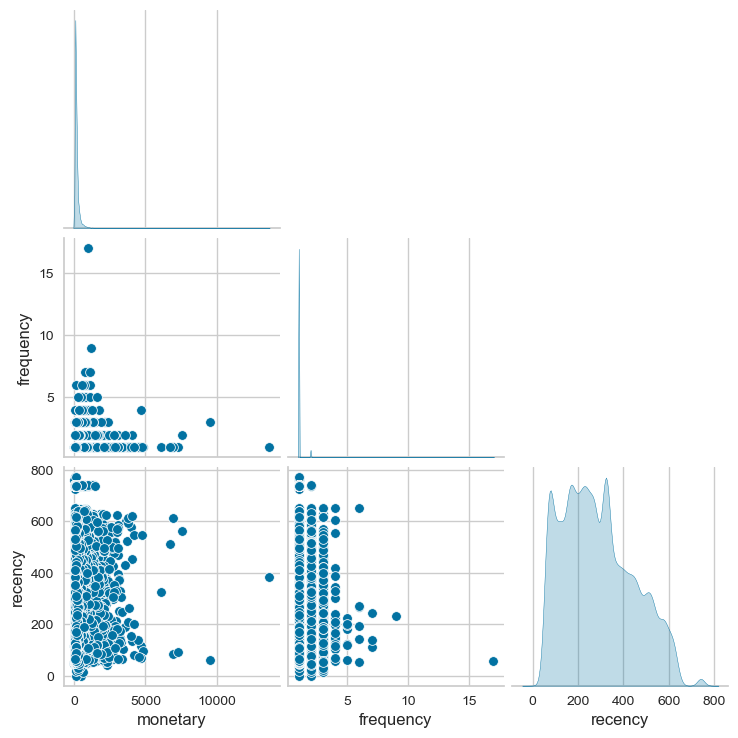

In [113]:
# Menampilkan Plot Hubungan Internal dari final_rfm_table
sns.pairplot(
    data=final_rfm_table,
    diag_kind='kde',
    corner=True
)


Berdasarkan plot hubungan internal, terlihat bahwa hubungan antara monetary dan recency bervariasi, sementara hubungan dengan frequency cenderung berpusat pada nilai yang lebih rendah. Hubungan antara recency dan frequency juga perlu diperhatikan, dengan hubungan mereka bervariasi pada recency tetapi sangat condong ke kanan pada frequency, yang berarti frequency cenderung memiliki nilai yang lebih rendah dengan sedikit nilai yang tinggi.

In [114]:
# Membuat label dan mengelompokkan pelanggan Olist dengan skor RFM
rfm_score = final_rfm_table.copy()
rfm_score['recency_score'] = pd.qcut(
    rfm_score['recency'],
    q=4,
    labels=[1, 2, 3, 4]
)

rfm_score['frequency_score'] = final_rfm_table['frequency'].apply(lambda x: '1' if x == 1 else '2')
rfm_score['monetary_score'] = pd.qcut(
    rfm_score['monetary'],
    q=4,
    labels=[1, 2, 3, 4]
)

print('\n' + (' Label & Segmentasi ').center(151, '=') + '\n')
display(rfm_score.head())
print('\n' + (' Kamus Segmentasi ').center(151, '=') + '\n')



================================================================== Label & Segmentasi =================================================================



,customer_unique_id,monetary,frequency,recency,recency_score,frequency_score,monetary_score
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160,1,1,3
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163,1,1,1
2,0000f46a3911fa3c0805444483337064,86.22,1,585,4,1,2
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369,3,1,1
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336,3,1,4



=================================================================== Kamus Segmentasi ==================================================================



In [115]:
# Membuat Definisi Segmen Kustom
def segment(x):
    if x in ['424', '324', '414', '214', '314', '224', '124', '114']:
        return 'GOLD'
    elif x in ['113', '112', '111']:
        return 'FRESHER'
    elif x in ['323', '423', '223', '421', '422', '321', '322']:
        return 'LOYAL'
    elif x in ['213', '211', '212', '222', '221', '121', '123', '122']:
        return 'AVERAGE'
    elif x in ['413', '412', '311', '313', '411', '312']:
        return 'GONERS'

rfm_score['score'] = rfm_score[['recency_score', 'frequency_score', 'monetary_score']].apply(lambda x: str(x[0]) + str(x[1]) + str(x[2]), axis=1)
rfm_score['segments'] = rfm_score['score'].apply(segment)
rfm_score.head()


,customer_unique_id,monetary,frequency,recency,recency_score,frequency_score,monetary_score,score,segments
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90,1,160,1,1,3,113,FRESHER
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,1,163,1,1,1,111,FRESHER
2,0000f46a3911fa3c0805444483337064,86.22,1,585,4,1,2,412,GONERS
3,0000f6ccb0745a6a4b88665a16c9f078,43.62,1,369,3,1,1,311,GONERS
4,0004aac84e0df4da2b147fca70cf8255,196.89,1,336,3,1,4,314,GOLD


In [116]:
# Menampilkan Statistik Deskriptif dari hasil rfm_score dan Mengelompokkannya berdasarkan Segment
rfm_score_descriptive = rfm_score.groupby('segments').describe()
rfm_score_descriptive = rfm_score_descriptive[rfm_score_descriptive.columns[np.r_[3:8,11:16,19:24]]]
rfm_score_descriptive['count'] = rfm_score.groupby('segments')['segments'].value_counts().values
rfm_score_descriptive[('ratio','(%)')] = rfm_score_descriptive['count'].apply(lambda x: round(x/rfm_score_descriptive['count'].sum()*100,2))
rfm_score_descriptive.apply(lambda row: row.map('{:.2f}'.format),axis=1)


monetary                                   frequency              \
              min     25%     50%     75%       max       min   25%   50%   
segments                                                                    
AVERAGE     13.36   53.31   83.41  124.31    183.53      1.00  1.00  1.00   
FRESHER      0.00   52.94   83.79  123.22    183.53      1.00  1.00  1.00   
GOLD       183.54  217.54  279.15  415.94  13664.08      1.00  1.00  1.00   
GONERS       0.00   53.71   81.11  119.50    183.53      1.00  1.00  1.00   
LOYAL       36.74  108.34  132.12  157.31    183.00      2.00  2.00  2.00   

                      recency                                     count  ratio  
           75%    max     min     25%     50%     75%     max              (%)  
segments                                                                        
AVERAGE   1.00   3.00   16.00  188.00  216.00  241.00  268.00  18062.00  18.80  
FRESHER   1.00   1.00    0.00   75.00  105.00  134.00  163.00  17612.00  18.33  
GOLD      1.00  17.00    0.00  162.00  265.00  394.00  743.00  24021.00  25.00  
GONERS    1.00   1.00  269.00  325.00  397.00  495.00  772.00  35670.00  37.12  
LOYAL     2.00   6.00  164.00  259.50  339.00  449.00  740.00    731.00   0.76

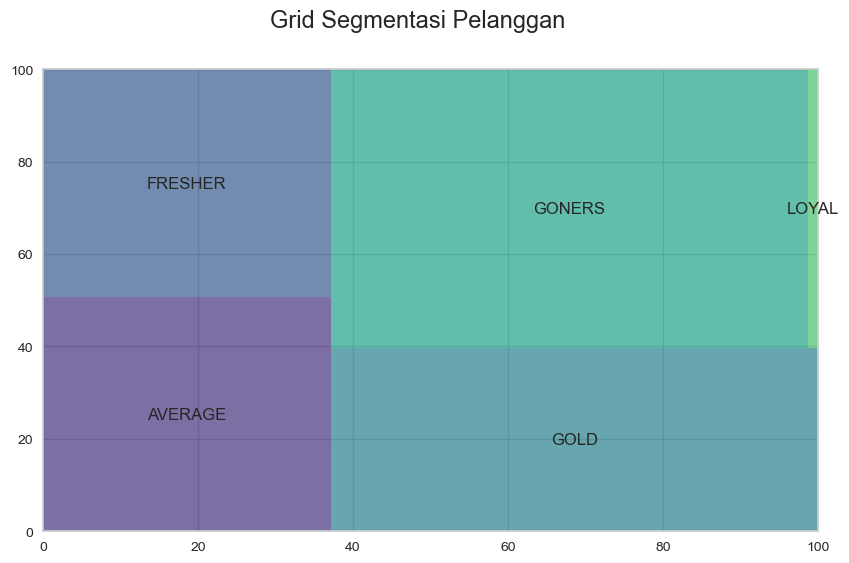

In [128]:
# Menampilkan Grid Segmentasi Pelanggan
plt.figure(figsize=(10, 6))
squarify.plot(
    sizes=rfm_score_descriptive['count'],
    label=rfm_score_descriptive['count'].index,
    color=sns.color_palette(palette='viridis'),
    alpha=0.7
)

plt.suptitle(
    'Grid Segmentasi Pelanggan', fontsize=17
)
plt.savefig('segment.png')


- Dari Grid Segmentasi Pelanggan di atas, terlihat bahwa Loyal Customer adalah segmen terkecil dibandingkan dengan segmen lainnya, sementara segmen terbesar adalah Gold dan Goners Customers. Olist harus merencanakan strategi tentang bagaimana menjaga Pelanggan Gold dan bagaimana membuat Pelanggan Goners untuk kembali dan berbelanja lagi di Olist.
- Sementara itu, untuk Pelanggan Fresher, Olist harus merencanakan sesuatu seperti menyediakan promosi menarik bagi mereka agar tetap menggunakan layanan Olist dan dapat menjadi Pelanggan Gold.


## Conclusion

**Kesimpulan: Analisis Data E-Commerce Olist**

Analisis komprehensif terhadap data e-commerce Olist memberikan wawasan berharga tentang berbagai aspek bisnis. Berikut adalah ringkasan temuan kunci dan kesimpulan dari proyek ini:

1. **Distribusi Geografis:**
   - Olist melayani pelanggan di seluruh wilayah Brasil, dengan distribusi pelanggan yang relatif merata di seluruh negara.
   - Visualisasi peta menggunakan Folium menyoroti kehadiran luas pelanggan Olist.

2. **Kinerja Penjualan:**
   - Penjualan tertinggi terjadi pada November 2017, kemungkinan terkait dengan acara Black Friday, menunjukkan lonjakan transaksi yang signifikan selama periode promosi.
   - Secara keseluruhan, penjualan total meningkat sebesar 137,04% dari Januari hingga Agustus 2017 ke periode yang sama pada 2018.

3. **Analisis Pembayaran dan Pengiriman:**
   - Pembayaran dengan kartu kredit adalah metode paling disukai, mencakup 73,99% dari total transaksi. Penggunaan kartu kredit memungkinkan pelanggan melakukan pembelian dengan fleksibilitas pembayaran cicilan.
   - Sebagian besar pelanggan memilih satu pembayaran cicilan, menunjukkan preferensi terhadap rencana pembayaran segera atau jangka pendek.

4. **Kinerja Pengiriman:**
   - Analisis kinerja pengiriman di seluruh negara bagian mengungkapkan variasi dalam nilai rata-rata pengiriman dan waktu pengiriman.
   - Negara bagian seperti Roraima, meskipun memiliki nilai rata-rata pengiriman yang tinggi, juga mengalami waktu pengiriman yang lebih lama. Hal ini bisa menjadi area yang perlu ditingkatkan dalam mengoptimalkan layanan pengiriman.

5. **Analisis RFM:**
   - Nilai Recency, Frequency, dan Monetary digunakan untuk analisis RFM untuk membagi pelanggan.
   - Distribusi nilai-nilai ini tidak normal, dengan Frequency menunjukkan pola yang miring ke kanan, menunjukkan konsentrasi nilai-nilai yang lebih rendah.

6. **Segmentasi Pelanggan:**
   - Segmentasi pelanggan menghasilkan lima segmen yang berbeda: Gold, Fresher, Loyal, Average, dan Goners.
   - Gold dan Goners merupakan segmen terbesar, menekankan perlunya strategi untuk mempertahankan pelanggan Gold dan mengaktifkan kembali Goners.

7. **Wawasan Segmen:**
   - Pelanggan Loyal, meskipun menjadi segmen terkecil, sangat penting. Strategi harus fokus untuk mempertahankan loyalitas mereka.
   - Segmen Gold dan Goners memerlukan perhatian khusus. Strategi harus bertujuan untuk mempertahankan pelanggan Gold dan mendorong Goners untuk kembali.

Secara keseluruhan, tim Olist dapat memanfaatkan wawasan ini untuk merumuskan strategi yang ditargetkan untuk retensi pelanggan, kampanye pemasaran, dan optimalisasi layanan. Memahami dinamika perilaku pelanggan, preferensi pembayaran, dan kinerja pengiriman akan berkontribusi pada keseluruhan kesuksesan dan pertumbuhan platform e-commerce Olist.